**Fatma AIDI -Projet 6: Classification automatiquement des biens de consommation**

Sur la place de marché, des vendeurs proposent des articles à des acheteurs en postant une photo et une description.  L'attribution de la catégorie d'un article est effectuée manuellement par les vendeurs et est donc peu fiable.
 
***Mission***:Etude de la faisabilité d'un moteur de classification des articles en différentes catégories, avec un niveau de précision suffisant.

In [1]:
import warnings

def fxn():
    warnings.warn("deprecated", DeprecationWarning)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()
    
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [2]:
pip install "gensim==3.8.1"


     |████████████████████████████████| 24.2MB 73.2MB/s 
  Found existing installation: gensim 3.6.0
    Uninstalling gensim-3.6.0:
      Successfully uninstalled gensim-3.6.0


In [3]:
# Data Structures
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


# Corpus Processing
import                                nltk
nltk.download('stopwords')
import                                string
import                                re
import                                nltk

from nltk.tokenize                    import word_tokenize
from nltk.tokenize                    import  RegexpTokenizer

from nltk                             import SnowballStemmer,PorterStemmer


from sklearn.pipeline                 import make_pipeline

from sklearn.preprocessing            import Normalizer
from sklearn.preprocessing            import StandardScaler
from sklearn.preprocessing            import scale
from sklearn.preprocessing            import normalize



from sklearn.cluster                  import KMeans
from sklearn.manifold                 import TSNE


from sklearn.decomposition            import TruncatedSVD
from sklearn.decomposition            import NMF
from sklearn.decomposition            import LatentDirichletAllocation
from sklearn.decomposition            import PCA


from sklearn.metrics                  import confusion_matrix
from sklearn.metrics                  import homogeneity_score
from sklearn.metrics                  import silhouette_score
from sklearn.metrics                  import adjusted_rand_score

from sklearn.feature_extraction.text  import TfidfVectorizer


import                                gensim
from gensim                           import corpora
from pprint                           import pprint
import                                gensim.downloader
from gensim                           import matutils, utils
from gensim.corpora                   import Dictionary

from gensim.models                    import CoherenceModel
from gensim.models                    import LdaModel
from gensim.models                    import TfidfModel


from gensim.models.basemodel          import BaseTopicModel
from gensim.models.nmf                import Nmf 
from gensim.parsing.preprocessing     import preprocess_string
from operator                         import itemgetter




[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [4]:
#Download databases
flipkart= pd.read_csv('/content/drive/MyDrive/Fatma Aidi/Parcours OCR/Data/flipkart_com-ecommerce_sample_1050.csv',sep=',')
data=flipkart.copy()

# Analyse exploratoire

In [97]:
data.head(7)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."
5,893aa5ed55f7cff2eccea7758d7a86bd,2015-12-04 07:25:36 +0000,http://www.flipkart.com/maserati-time-r8851116...,Maserati Time R8851116001 Analog Watch - For ...,"[""Watches >> Wrist Watches >> Maserati Time Wr...",WATEAYAHJ8CUCAYM,24400.0,24400.0,893aa5ed55f7cff2eccea7758d7a86bd.jpg,False,Maserati Time R8851116001 Analog Watch - For ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograp..."
6,f355cc1ccb08bd0d283ed979b7ee7515,2015-12-04 07:25:36 +0000,http://www.flipkart.com/camerii-wm64-elegance-...,"Camerii WM64 Elegance Analog Watch - For Men,...","[""Watches >> Wrist Watches >> Camerii Wrist Wa...",WATE6Y6D2MZHWGBZ,1099.0,449.0,f355cc1ccb08bd0d283ed979b7ee7515.jpg,False,"Camerii WM64 Elegance Analog Watch - For Men,...",5,5,NaN,"{""product_specification""=>[{""key""=>""Chronograp..."


**création de category**

In [98]:
data['category']=data['product_category_tree'].str.split(
    pat=">>",expand=True)[0]
data["category"] = data["category"].str.replace('[', "")
data["category"] = data["category"].str.replace('"', "")
data["category"] = data["category"].str.replace(' ', "")

catg  = {'HomeFurnishing':'Home',
         'HomeDecor&FestiveNeeds':'Decor',
         'Watches':'Watches',
         'BabyCare':'Baby',
         'BeautyandPersonalCare':'Beauty',
         'Computers':'Computers',
         'Kitchen&Dining':'Kitchen'}
data['category'] =[catg[i] for i in data['category']]
cluster  = {'Baby':0,
           'Decor':1,
           'Computers':2,
           'Watches':3,
           'Kitchen':4,
           'Home':5,
           'Beauty':6}

y_true = data['category'].map(cluster)

In [99]:
data['category'].value_counts()

Beauty       150
Watches      150
Baby         150
Home         150
Kitchen      150
Computers    150
Decor        150
Name: category, dtype: int64

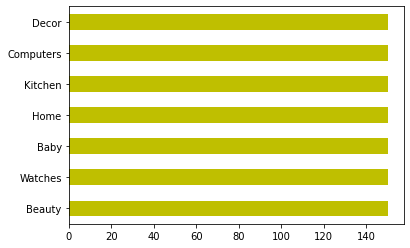

In [100]:
data['category'].value_counts().sort_values().plot(kind = 'barh', color='y')


In [101]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [102]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
uniq_id,1050,1050,b4ccd4c315d99edd7c00d015b714485a,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
crawl_timestamp,1050,149,2015-12-01 12:40:44 +0000,150,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_url,1050,1050,http://www.flipkart.com/de-techinn-flexible-wi...,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_name,1050,1050,"Simoco 7 W, 9 W, 12 W LED Bulb",1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
product_category_tree,1050,642,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",56,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pid,1050,1050,CBKEJ5Q6KRZM6CZN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
retail_price,1049,NaN,NaN,NaN,2186.2,7639.23,35,555,999,1999,201000
discounted_price,1049,NaN,NaN,NaN,1584.53,7475.1,35,340,600,1199,201000
image,1050,1050,23b0bdd337f7d1b4b70ad13726a122ab.jpg,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
is_FK_Advantage_product,1050,2,False,993,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [103]:
data=data[['category','description','product_name']]

# Pétraitement des données Textuelles.

## 1ère stratégie: text cleaning

**normalisation**

In [104]:
data["description_clean"] = data["description"].apply(lambda x: x.lower())
data["name_clean"] = data["product_name"].apply(lambda x: x.lower())

display(data.sample(5))

,category,description,product_name,description_clean,name_clean
462,Home,Key Features of Amit Carpet Polyester Medium D...,Amit Carpet Polyester Medium Door Mat ACI20160340,key features of amit carpet polyester medium d...,amit carpet polyester medium door mat aci20160340
688,Beauty,Flipkart.com: Buy Whiteherbs Ultra Protection ...,Whiteherbs Ultra Protection Sunscreen Lotion -...,flipkart.com: buy whiteherbs ultra protection ...,whiteherbs ultra protection sunscreen lotion -...
502,Watches,Maxima 01433CMGY Gold Analog Watch - For Men ...,Maxima 01433CMGY Gold Analog Watch - For Men,maxima 01433cmgy gold analog watch - for men ...,maxima 01433cmgy gold analog watch - for men
341,Computers,Buy Belkin Share Modem (N) Router only for Rs....,Belkin Share Modem (N) Router,buy belkin share modem (n) router only for rs....,belkin share modem (n) router
106,Baby,Buy Bestway 1.47m x 1.47m x 1.22m/Play With Su...,Bestway 1.47m x 1.47m x 1.22m/Play With Sun Sh...,buy bestway 1.47m x 1.47m x 1.22m/play with su...,bestway 1.47m x 1.47m x 1.22m/play with sun sh...


**contractions**

On utilise contraction pour simplifier les text, exemple: 
 -> we will or we shouldnt've -> we should not have.

In [105]:
!pip install contractions


In [106]:
import contractions
data["description_clean"] = data["description_clean"].apply(lambda x: contractions.fix(x))
data["name_clean"] = data["name_clean"].apply(lambda x: contractions.fix(x))

display(data.sample(5))

,category,description,product_name,description_clean,name_clean
134,Kitchen,Buy Rajesh Digital BEST DAD 107 Ceramic Mug fo...,Rajesh Digital BEST DAD 107 Ceramic Mug,buy rajesh digital best dad 107 ceramic mug fo...,rajesh digital best dad 107 ceramic mug
2,Baby,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set,key features of eurospa cotton terry face towe...,eurospa cotton terry face towel set
123,Decor,Key Features of Craftcart Parrot Antique Brass...,Craftcart Parrot Antique Brass Key Holder,key features of craftcart parrot antique brass...,craftcart parrot antique brass key holder
915,Baby,Key Features of FS Mini Klub Baby Boy's Woven ...,FS Mini Klub Baby Boy's Woven Casual Shirt,key features of fs mini klub baby boy's woven ...,fs mini klub baby boy's woven casual shirt
713,Home,"Buy Home Originals Abstract, Geometric Double ...","Home Originals Abstract, Geometric Double Blan...","buy home originals abstract, geometric double ...","home originals abstract, geometric double blan..."


**URLs with http , www , HTML tags**

In [107]:
def remove_Noise(text):
    """
        Remove URLs from a sample string

    """
    text=text.translate(str.maketrans(' ', ' ', string.punctuation)) #remove ponctuatio,
    text = text.rstrip('\n')              # Removes line breaks
    text=re.sub(r"https?://\S+|www\.\S+", "  ", text)
    #html = re.compile(r"<.*?>|&([a-z0-9]+|#[0-9]{1,6}|#x[0-9a-f]{1,6});")
    #text=re.sub(html, "", text)
    text =re.sub(r'[^\x00-\x7f]',r' ', text) #Remove non-ASCII characters
    text=re.sub('\W_',' ', text)        # removes specials characters and leaves only words
    text = re.sub("\S*\d\S*","  ", text)   # removes numbers and words concatenated with numbers IE h4ck3r. Removes road names such as BR-381.
    text = re.sub("\S*@\S*\s?","  ", text) # removes emails and mentions (words with @)
    return text



In [108]:
data["description_clean"] = data["description_clean"].apply(lambda x: remove_Noise(x))
data["name_clean"] = data["name_clean"].apply(lambda x: remove_Noise(x))

display(data.sample(5))
#test
idex=450
text=data.description[idex]
print('#text originale#:',text)
text_modifier=data['description_clean'][idex]
print('#text modifié#  :',text_modifier)

,category,description,product_name,description_clean,name_clean
372,Beauty,"Flipkart.com: Buy Wild Stone Charge,Surge Comb...","Wild Stone Charge,Surge Combo Set",flipkartcom buy wild stone chargesurge combo s...,wild stone chargesurge combo set
543,Watches,Sonata 7052YM07 Watch - Buy Sonata 7052YM07 Wa...,Sonata 7052YM07 Watch,sonata watch buy sonata watch onlin...,sonata watch
649,Decor,Key Features of KLOCX Analog Wall Clock Black ...,KLOCX Analog Wall Clock,key features of klocx analog wall clock black ...,klocx analog wall clock
573,Watches,Gift Island AST906 Analog Watch - For Women -...,Gift Island AST906 Analog Watch - For Women,gift island analog watch for women buy g...,gift island analog watch for women
481,Computers,Buy Lapguard HP Pavilion DV7-6000 Series 6 Cel...,Lapguard HP Pavilion DV7-6000 Series 6 Cell La...,buy lapguard hp pavilion series cell lap...,lapguard hp pavilion series cell laptop ...


#text originale#: Specifications of Upside Down Sleeveless Applique Baby Girl's, Baby Boy's Jacket General Details Ideal For Baby Girl's, Baby Boy's Pattern Applique Jacket Details Fabric Poly Cotton Reversible No Hooded No Closure Buttons Sleeve Sleeveless Lining Cotton Fabric Care Dont Wash With Other Garments, Hand Wash With Mild Detergent,Dont Tumble Dry, Dry In Shade. Additional Details Style Code LIGHT PINK SMILEY FACE JACKET Other Details Sleeveless In the Box 1 Jacket
#text modifié#  : specifications of upside down sleeveless applique baby girls baby boys jacket general details ideal for baby girls baby boys pattern applique jacket details fabric poly cotton reversible no hooded no closure buttons sleeve sleeveless lining cotton fabric care do not wash with other garments hand wash with mild detergentdo not tumble dry dry in shade additional details style code light pink smiley face jacket other details sleeveless in the box    jacket


**emojis**

In [109]:
def remove_special_characters(text):

    emoji_pattern = re.compile(
        '['
        u'\U0001F600-\U0001F64F'  # emoticons
        u'\U0001F300-\U0001F5FF'  # symbols & pictographs
        u'\U0001F680-\U0001F6FF'  # transport & map symbols
        u'\U0001F1E0-\U0001F1FF'  # flags (iOS)
        u'\U00002702-\U000027B0'
        u'\U000024C2-\U0001F251'
        ']+',
        flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

In [110]:
data["description_clean"] = data["description_clean"].apply(lambda x: remove_special_characters(x))
data["name_clean"] = data["name_clean"].apply(lambda x: remove_special_characters(x))

display(data.sample(5))
#test
text=data.description[idex]
print('#text originale#:',text)
text_modifier=data['description_clean'][idex]
print('#text modifié#  :',text_modifier)

,category,description,product_name,description_clean,name_clean
538,Watches,Sonata 7092SL01 Yuva Analog Watch - For Men -...,Sonata 7092SL01 Yuva Analog Watch - For Men,sonata yuva analog watch for men buy son...,sonata yuva analog watch for men
837,Computers,Buy Casotec Plexible LED Light 275012 Led Ligh...,Casotec Plexible LED Light 275012 Led Light US...,buy casotec plexible led light led light us...,casotec plexible led light led light usb le...
167,Kitchen,Buy Printland PMR1174 Ceramic Mug for Rs.299 o...,Printland PMR1174 Ceramic Mug,buy printland ceramic mug for online pri...,printland ceramic mug
352,Computers,Buy Zyxel PLA-4205 only for Rs. 8100 from Flip...,Zyxel PLA-4205,buy zyxel only for rs from flipkartcom o...,zyxel
967,Baby,Key Features of Mahadev Handicrafts Cotton Car...,Mahadev Handicrafts Cotton Cartoon Double Beds...,key features of mahadev handicrafts cotton car...,mahadev handicrafts cotton cartoon double beds...


#text originale#: Specifications of Upside Down Sleeveless Applique Baby Girl's, Baby Boy's Jacket General Details Ideal For Baby Girl's, Baby Boy's Pattern Applique Jacket Details Fabric Poly Cotton Reversible No Hooded No Closure Buttons Sleeve Sleeveless Lining Cotton Fabric Care Dont Wash With Other Garments, Hand Wash With Mild Detergent,Dont Tumble Dry, Dry In Shade. Additional Details Style Code LIGHT PINK SMILEY FACE JACKET Other Details Sleeveless In the Box 1 Jacket
#text modifié#  : specifications of upside down sleeveless applique baby girls baby boys jacket general details ideal for baby girls baby boys pattern applique jacket details fabric poly cotton reversible no hooded no closure buttons sleeve sleeveless lining cotton fabric care do not wash with other garments hand wash with mild detergentdo not tumble dry dry in shade additional details style code light pink smiley face jacket other details sleeveless in the box    jacket


## 2ème stratégie: Text Final

La tokenisation est une technique courante qui divise une phrase en plusieur éléments, où un élement peut être un caractère, un mot, une phrase, un symbole ou tout autre élément significatif. En divisant les phrases en plus petits morceaux, cela permet d'étudier les mots d'une phrase et créer Topic Modeling

In [111]:
from collections import Counter
  
def tokenization(text):
  nltk_tokens = nltk.word_tokenize(text)

  ordered_tokens = set()
  result = []
  for word in nltk_tokens:
      if word not in ordered_tokens:
          ordered_tokens.add(word)
          result.append(word)
  return " ".join(result) # Return the text untokenize

    


In [112]:
# Tokenizing  texts.
from nltk.tokenize import word_tokenize
nltk.download('punkt')

data['description_tokenized'] = data["description_clean"].apply(lambda x: tokenization(x))
data['name_tokenized'] = data["name_clean"].apply(lambda x: tokenization(x))

display(data.sample(5))
#test
text=data.description[idex]
print('#text originale#:',text)
text_modifier=data['description_clean'][idex]
print('#text modifié#  :',text_modifier)
text_tokenized=data['description_tokenized'][idex]
print('#text tokenisé#  :',text_tokenized)


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


,category,description,product_name,description_clean,name_clean,description_tokenized,name_tokenized
350,Computers,Buy TP-LINK TL-WR702N 150Mbps Wireless N Nano ...,TP-LINK TL-WR702N 150Mbps Wireless N Nano Router,buy tplink wireless n nano router only f...,tplink wireless n nano router,buy tplink wireless n nano router only for rs ...,tplink wireless n nano router
456,Home,Buy Scalabedding Cotton Striped King sized Dou...,Scalabedding Cotton Striped King sized Double ...,buy scalabedding cotton striped king sized dou...,scalabedding cotton striped king sized double ...,buy scalabedding cotton striped king sized dou...,scalabedding cotton striped king sized double ...
171,Kitchen,Buy Prithish We're All Mad Here Ceramic Mug fo...,Prithish We're All Mad Here Ceramic Mug,buy prithish we are all mad here ceramic mug f...,prithish we are all mad here ceramic mug,buy prithish we are all mad here ceramic mug f...,prithish we are all mad here ceramic mug
723,Home,Buy House This Yellow 150 cm Table Runner at R...,House This Yellow 150 cm Table Runner,buy house this yellow cm table runner at rs...,house this yellow cm table runner,buy house this yellow cm table runner at rs fl...,house this yellow cm table runner
711,Home,Frabjous Floral Single Quilts & Comforters Mul...,Frabjous Floral Single Quilts & Comforters Mul...,frabjous floral single quilts comforters mult...,frabjous floral single quilts comforters mult...,frabjous floral single quilts comforters multi...,frabjous floral single quilts comforters multi...


#text originale#: Specifications of Upside Down Sleeveless Applique Baby Girl's, Baby Boy's Jacket General Details Ideal For Baby Girl's, Baby Boy's Pattern Applique Jacket Details Fabric Poly Cotton Reversible No Hooded No Closure Buttons Sleeve Sleeveless Lining Cotton Fabric Care Dont Wash With Other Garments, Hand Wash With Mild Detergent,Dont Tumble Dry, Dry In Shade. Additional Details Style Code LIGHT PINK SMILEY FACE JACKET Other Details Sleeveless In the Box 1 Jacket
#text modifié#  : specifications of upside down sleeveless applique baby girls baby boys jacket general details ideal for baby girls baby boys pattern applique jacket details fabric poly cotton reversible no hooded no closure buttons sleeve sleeveless lining cotton fabric care do not wash with other garments hand wash with mild detergentdo not tumble dry dry in shade additional details style code light pink smiley face jacket other details sleeveless in the box    jacket
#text tokenisé#  : specifications of upside

### Supprimer Stop Words 

In [113]:
def supp_stopwords(text):
    nltk_tokens = nltk.word_tokenize(text)
    stop = set(stopwords.words('english'))
    corpus = [word for word in nltk_tokens if word not in stop]
    
    return ' '.join(map(str, corpus)) # Return the text untokenize

In [114]:
# Removing stopwords.
nltk.download("stopwords")
from nltk.corpus import stopwords


data['description_stopword'] = data['description_tokenized'].apply(lambda x: supp_stopwords(x))
data['name_stopword'] = data['name_tokenized'].apply(lambda x: supp_stopwords(x))
display(data.sample(5))
#test
text=data.description[idex]
print('#text originale#:',text)
text_modifier=data['description_stopword'][idex]
print('#text sans stopwords#  :',text_modifier)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,category,description,product_name,description_clean,name_clean,description_tokenized,name_tokenized,description_stopword,name_stopword
637,Baby,Key Features of FS Mini Klub Printed Baby Boy'...,FS Mini Klub Printed Baby Boy's Multicolor Bas...,key features of fs mini klub printed baby boys...,fs mini klub printed baby boys multicolor basi...,key features of fs mini klub printed baby boys...,fs mini klub printed baby boys multicolor basi...,key features fs mini klub printed baby boys mu...,fs mini klub printed baby boys multicolor basi...
739,Kitchen,Buyer's Beach BB349 (Brown) Price: Rs. 449 Sty...,Buyer's Beach BB349,buyers beach brown price rs stylish in e...,buyers beach,buyers beach brown price rs stylish in every d...,buyers beach,buyers beach brown price rs stylish every disc...,buyers beach
32,Watches,"D'Signer 681GM_WHT Analog Watch - For Men, Bo...","D'Signer 681GM_WHT Analog Watch - For Men, Boys",dsigner analog watch for men boys buy ds...,dsigner analog watch for men boys,dsigner analog watch for men boys buy online a...,dsigner analog watch for men boys,dsigner analog watch men boys buy online india...,dsigner analog watch men boys
805,Beauty,Buy Oxyglow Bearberry Face Wash & Fruit Massag...,Oxyglow Bearberry Face Wash & Fruit Massage Cr...,buy oxyglow bearberry face wash fruit massage...,oxyglow bearberry face wash fruit massage cre...,buy oxyglow bearberry face wash fruit massage ...,oxyglow bearberry face wash fruit massage crea...,buy oxyglow bearberry face wash fruit massage ...,oxyglow bearberry face wash fruit massage crea...
181,Kitchen,Printland CMW1670 Ceramic Mug (350 g)\r\n ...,Printland CMW1670 Ceramic Mug,printland ceramic mug g\r\n ...,printland ceramic mug,printland ceramic mug g price rs coffee is an ...,printland ceramic mug,printland ceramic mug g price rs coffee adorab...,printland ceramic mug


#text originale#: Specifications of Upside Down Sleeveless Applique Baby Girl's, Baby Boy's Jacket General Details Ideal For Baby Girl's, Baby Boy's Pattern Applique Jacket Details Fabric Poly Cotton Reversible No Hooded No Closure Buttons Sleeve Sleeveless Lining Cotton Fabric Care Dont Wash With Other Garments, Hand Wash With Mild Detergent,Dont Tumble Dry, Dry In Shade. Additional Details Style Code LIGHT PINK SMILEY FACE JACKET Other Details Sleeveless In the Box 1 Jacket
#text sans stopwords#  : specifications upside sleeveless applique baby girls boys jacket general details ideal pattern fabric poly cotton reversible hooded closure buttons sleeve lining care wash garments hand mild detergentdo tumble dry shade additional style code light pink smiley face box


### Lemmatization

In [115]:
from nltk.stem.wordnet import WordNetLemmatizer
nltk.download('averaged_perceptron_tagger')

def keep_text(text):

    lemmatizer = WordNetLemmatizer()

    tokens_tagged = nltk.pos_tag(nltk.word_tokenize(text))  # tokenize the text then return a list of tuple (token, nltk_tag)
    lemmatized_text = []
    for word, tag in tokens_tagged:
        if tag.startswith('JJ'):
            lemmatized_text.append(lemmatizer.lemmatize(word,'a')) # Lemmatisze adjectives. Not doing anything since we remove all adjective
        elif tag.startswith('V'):
            lemmatized_text.append(lemmatizer.lemmatize(word,'v')) # Lemmatisze verbs
        elif tag.startswith('N'):
            lemmatized_text.append(lemmatizer.lemmatize(word,'n')) # Lemmatisze nouns
        elif tag.startswith('R'):
            lemmatized_text.append(lemmatizer.lemmatize(word,'r')) # Lemmatisze adverbs
        else:
            lemmatized_text.append(lemmatizer.lemmatize(word)) # If no tags has been found, perform a non specific lemmatization
    return " ".join(lemmatized_text) # Return the text untokenize

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [116]:
nltk.download('wordnet')
data["description_lemm"] = data["description_stopword"].apply(lambda x: keep_text(x))
data["name_lemm"] = data["name_stopword"].apply(lambda x: keep_text(x))

display(data.sample(5))
#test
text=data.description_stopword[idex]
print('#text originale#:',text)
text_modifier=data['description_lemm'][idex]
print('#text modifié#  :',text_modifier)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


,category,description,product_name,description_clean,name_clean,description_tokenized,name_tokenized,description_stopword,name_stopword,description_lemm,name_lemm
789,Baby,Buy Love Baby Cartoon Set of Towels at Rs. 425...,Love Baby Cartoon Set of Towels,buy love baby cartoon set of towels at rs a...,love baby cartoon set of towels,buy love baby cartoon set of towels at rs flip...,love baby cartoon set of towels,buy love baby cartoon set towels rs flipkartco...,love baby cartoon set towels,buy love baby cartoon set towel rs flipkartcom...,love baby cartoon set towel
215,Kitchen,King International Ergonomic Design with Long ...,King International Ergonomic Design with Long ...,king international ergonomic design with long ...,king international ergonomic design with long ...,king international ergonomic design with long ...,king international ergonomic design with long ...,king international ergonomic design long gripp...,king international ergonomic design long gripp...,king international ergonomic design long grip ...,king international ergonomic design long grip ...
910,Baby,Specifications of Beebay Baby Boy's Checkered ...,Beebay Baby Boy's Checkered Casual Shirt,specifications of beebay baby boys checkered c...,beebay baby boys checkered casual shirt,specifications of beebay baby boys checkered c...,beebay baby boys checkered casual shirt,specifications beebay baby boys checkered casu...,beebay baby boys checkered casual shirt,specification beebay baby boy checker casual s...,beebay baby boy checker casual shirt
266,Kitchen,"Pigeon Kadhai 1.2 L (Aluminium, Glass, Non-sti...",Pigeon Kadhai 1.2 L,pigeon kadhai l aluminium glass nonstick\r\...,pigeon kadhai l,pigeon kadhai l aluminium glass nonstick price...,pigeon kadhai l,pigeon kadhai l aluminium glass nonstick price...,pigeon kadhai l,pigeon kadhai l aluminium glass nonstick price...,pigeon kadhai l
196,Decor,"Tatvaarts Urli Showpiece - 21.59 cm (Brass, ...",Tatvaarts Urli Showpiece - 21.59 cm,tatvaarts urli showpiece cm brass gold\r...,tatvaarts urli showpiece cm,tatvaarts urli showpiece cm brass gold price r...,tatvaarts urli showpiece cm,tatvaarts urli showpiece cm brass gold price r...,tatvaarts urli showpiece cm,tatvaarts urli showpiece cm brass gold price r...,tatvaarts urli showpiece cm


#text originale#: specifications upside sleeveless applique baby girls boys jacket general details ideal pattern fabric poly cotton reversible hooded closure buttons sleeve lining care wash garments hand mild detergentdo tumble dry shade additional style code light pink smiley face box
#text modifié#  : specification upside sleeveless applique baby girl boys jacket general detail ideal pattern fabric poly cotton reversible hood closure button sleeve line care wash garment hand mild detergentdo tumble dry shade additional style code light pink smiley face box


### supprimer adjective, adverbe, verbe

In [117]:
#removes adverbe
adjective_tag_list = ['V','JJ','RB','JJR', 'JJS', 'RBR', 'RBS'] # List of Adjective's,Verbe's tag from nltk package

def remove_adv(text):
  nltk_tokens = nltk.word_tokenize(text)
  corpus  = [word for word, pos in nltk.pos_tag(nltk_tokens) if not  pos in adjective_tag_list] # Select all words that don't have the undesired tags
  return   ' '.join(map(str, corpus)) 

In [118]:
data['description_adv']=data['description_lemm'].apply(lambda x: remove_adv(x))
data["name_adv"] = data["name_lemm"].apply(lambda x: remove_adv(x))

display(data.sample(5))
#test
text=data.description_lemm[idex]
print('#text originale#:',text)
text_modifier=data['description_adv'][idex]
print('#text modifié#  :',text_modifier)

,category,description,product_name,description_clean,name_clean,description_tokenized,name_tokenized,description_stopword,name_stopword,description_lemm,name_lemm,description_adv,name_adv
312,Computers,Buy Intex W150D only for Rs. 1149 from Flipkar...,Intex W150D,buy intex only for rs from flipkartcom o...,intex,buy intex only for rs from flipkartcom genuine...,intex,buy intex rs flipkartcom genuine products day ...,intex,buy intex r flipkartcom genuine product day re...,intex,buy r flipkartcom product day guarantee shippi...,intex
793,Baby,Ollington St. Collection Baby Reusable Diaper ...,Ollington St. Collection Baby Reusable Diaper ...,ollington st collection baby reusable diaper w...,ollington st collection baby reusable diaper w...,ollington st collection baby reusable diaper w...,ollington st collection baby reusable diaper w...,ollington st collection baby reusable diaper o...,ollington st collection baby reusable diaper o...,ollington st collection baby reusable diaper o...,ollington st collection baby reusable diaper o...,ollington st collection baby diaper one insert...,ollington st collection baby diaper one insert
1018,Computers,Key Features of PRINT SHAPES Sony headphone La...,PRINT SHAPES Sony headphone Laptop Skin with M...,key features of print shapes sony headphone la...,print shapes sony headphone laptop skin with m...,key features of print shapes sony headphone la...,print shapes sony headphone laptop skin with m...,key features print shapes sony headphone lapto...,print shapes sony headphone laptop skin mouse ...,key feature print shape sony headphone laptop ...,print shape sony headphone laptop skin mouse p...,feature print shape sony headphone skin mouse ...,print shape sony headphone skin mouse pad comb...
984,Decor,Buy Art Godaam Colored figure Showpiece - 50...,Art Godaam Colored figure Showpiece - 50 cm,buy art godaam colored figure showpiece ...,art godaam colored figure showpiece cm,buy art godaam colored figure showpiece cm for...,art godaam colored figure showpiece cm,buy art godaam colored figure showpiece cm onl...,art godaam colored figure showpiece cm,buy art godaam color figure showpiece cm onlin...,art godaam color figure showpiece cm,buy art godaam color figure showpiece cm onlin...,art godaam color figure showpiece cm
378,Beauty,"Flipkart.com: Buy Engage Rush , Jump Combo Set...","Engage Rush , Jump Combo Set",flipkartcom buy engage rush jump combo set on...,engage rush jump combo set,flipkartcom buy engage rush jump combo set onl...,engage rush jump combo set,flipkartcom buy engage rush jump combo set onl...,engage rush jump combo set,flipkartcom buy engage rush jump combo set onl...,engage rush jump combo set,flipkartcom buy engage jump combo set r produc...,engage rush jump combo set


#text originale#: specification upside sleeveless applique baby girl boys jacket general detail ideal pattern fabric poly cotton reversible hood closure button sleeve line care wash garment hand mild detergentdo tumble dry shade additional style code light pink smiley face box
#text modifié#  : specification applique baby girl boys jacket detail ideal poly cotton hood closure button sleeve line care wash garment hand detergentdo shade style code pink face box


### Stemming

In [119]:
stemmer = SnowballStemmer('english')
stemmerport=PorterStemmer()
def stem_text(text):
    words = nltk.word_tokenize(text) # tokenize the text then return a list of tuple (token, nltk_tag)
    stem_text = []
    for word in words:
        text=stemmer.stem(word) # Stem each words
        stem_text.append(stemmerport.stem(text)) # Stem each words
    return " ".join(stem_text) # Return the text untokenize

In [120]:
data['description_stem'] = data['description_adv'].apply(lambda x: stem_text(x)) 
data['name_stem'] = data['name_adv'].apply(lambda x: stem_text(x)) 

In [121]:
display(data.sample(5))
#test
text=data.description_adv[idex]
print('#text originale#:',text)
text_modifier=data['description_stem'][idex]
print('#text modifié#  :',text_modifier)

,category,description,product_name,description_clean,name_clean,description_tokenized,name_tokenized,description_stopword,name_stopword,description_lemm,name_lemm,description_adv,name_adv,description_stem,name_stem
385,Beauty,Flipkart.com: Buy Archies VJ-580 Combo Set onl...,Archies VJ-580 Combo Set,flipkartcom buy archies combo set online on...,archies combo set,flipkartcom buy archies combo set online only ...,archies combo set,flipkartcom buy archies combo set online rs ge...,archies combo set,flipkartcom buy archies combo set online r gen...,archies combo set,flipkartcom buy archies combo set r product da...,archies combo set,flipkartcom buy archi combo set r product day ...,archi combo set
565,Watches,Sonata 8097YM03 Analog Watch - For Women - Bu...,Sonata 8097YM03 Analog Watch - For Women,sonata analog watch for women buy sonata...,sonata analog watch for women,sonata analog watch for women buy online at in...,sonata analog watch for women,sonata analog watch women buy online india fli...,sonata analog watch women,sonata analog watch woman buy online india fli...,sonata analog watch woman,sonata analog watch woman buy online flipkartc...,sonata analog watch woman,sonata analog watch woman buy onlin flipkartco...,sonata analog watch woman
307,Decor,Buy Aapno Rajasthan Marvel In Marble - Gold Em...,Aapno Rajasthan Marvel In Marble - Gold Emboss...,buy aapno rajasthan marvel in marble gold emb...,aapno rajasthan marvel in marble gold embosse...,buy aapno rajasthan marvel in marble gold embo...,aapno rajasthan marvel in marble gold embossed...,buy aapno rajasthan marvel marble gold embosse...,aapno rajasthan marvel marble gold embossed ro...,buy aapno rajasthan marvel marble gold emboss ...,aapno rajasthan marvel marble gold emboss roli...,buy aapno rajasthan marvel gold emboss roli ti...,marvel gold emboss roli tika chopra showpiece cm,buy aapno rajasthan marvel gold emboss roli ti...,marvel gold emboss roli tika chopra showpiec cm
729,Decor,Key Features of VRCT 196 inch Green Rice Light...,VRCT 196 inch Green Rice Lights,key features of vrct inch green rice lights...,vrct inch green rice lights,key features of vrct inch green rice lights nu...,vrct inch green rice lights,key features vrct inch green rice lights numbe...,vrct inch green rice lights,key feature vrct inch green rice light number ...,vrct inch green rice light,feature vrct inch rice light number multifunct...,vrct inch rice light,featur vrct inch rice light number multifunct ...,vrct inch rice light
637,Baby,Key Features of FS Mini Klub Printed Baby Boy'...,FS Mini Klub Printed Baby Boy's Multicolor Bas...,key features of fs mini klub printed baby boys...,fs mini klub printed baby boys multicolor basi...,key features of fs mini klub printed baby boys...,fs mini klub printed baby boys multicolor basi...,key features fs mini klub printed baby boys mu...,fs mini klub printed baby boys multicolor basi...,key feature fs mini klub print baby boy multic...,f mini klub print baby boy multicolor basic short,feature fs mini klub print baby boy multicolor...,f mini klub print baby boy multicolor,featur fs mini klub print babi boy multicolor ...,f mini klub print babi boy multicolor


#text originale#: specification applique baby girl boys jacket detail ideal poly cotton hood closure button sleeve line care wash garment hand detergentdo shade style code pink face box
#text modifié#  : specif appliqu babi girl boy jacket detail ideal poli cotton hood closur button sleev line care wash garment hand detergentdo shade style code pink face box


### supprimer les mots courts

In [122]:
# removes any words composed of less than 2 or more than 21 letters
def short_words(text):
    nltk_tokens = nltk.word_tokenize(text)
    twoLetterWord = []
    for token in nltk_tokens:
        if len(token) <= 2 or len(token) >= 21:
            twoLetterWord.append(token)
    corpus = [word for word in nltk_tokens if word not in twoLetterWord]
    return ' '.join(map(str, corpus)) # Return the text untokenize

In [123]:
data["description_short"] = data["description_stem"].apply(lambda x: short_words(x))
data["name_short"] = data["name_stem"].apply(lambda x: short_words(x))

display(data.sample(5))
#test
text=data.description_stem[idex]
print('#text originale#:',text)
text_modifier=data['description_short'][idex]
print('#text modifié#  :',text_modifier)

,category,description,product_name,description_clean,name_clean,description_tokenized,name_tokenized,description_stopword,name_stopword,description_lemm,name_lemm,description_adv,name_adv,description_stem,name_stem,description_short,name_short
116,Decor,"Recrafto Buddha Showpiece - 15.24 cm (Brass,...",Recrafto Buddha Showpiece - 15.24 cm,recrafto buddha showpiece cm brass black...,recrafto buddha showpiece cm,recrafto buddha showpiece cm brass black green...,recrafto buddha showpiece cm,recrafto buddha showpiece cm brass black green...,recrafto buddha showpiece cm,recrafto buddha showpiece cm brass black green...,recrafto buddha showpiece cm,recrafto buddha showpiece cm brass price r idol,recrafto buddha showpiece cm,recrafto buddha showpiec cm brass price r idol,recrafto buddha showpiec cm,recrafto buddha showpiec brass price idol,recrafto buddha showpiec
460,Baby,Key Features of Beebay Baby Girl's Fit and Fla...,Beebay Baby Girl's Fit and Flare Dress,key features of beebay baby girls fit and flar...,beebay baby girls fit and flare dress,key features of beebay baby girls fit and flar...,beebay baby girls fit and flare dress,key features beebay baby girls fit flare dress...,beebay baby girls fit flare dress,key feature beebay baby girl fit flare dress c...,beebay baby girl fit flare dress,feature beebay baby girl fit flare flarebeebay...,beebay baby girl fit flare dress,featur beebay babi girl fit flare flarebeebay ...,beebay babi girl fit flare dress,featur beebay babi girl fit flare flarebeebay ...,beebay babi girl fit flare dress
779,Beauty,Buy Mxofere Combo Rose Jasmine Almond Honey Al...,Mxofere Combo Rose Jasmine Almond Honey Aloeve...,buy mxofere combo rose jasmine almond honey al...,mxofere combo rose jasmine almond honey aloeve...,buy mxofere combo rose jasmine almond honey al...,mxofere combo rose jasmine almond honey aloeve...,buy mxofere combo rose jasmine almond honey al...,mxofere combo rose jasmine almond honey aloeve...,buy mxofere combo rise jasmine almond honey al...,mxofere combo rise jasmine almond honey aloeve...,buy mxofere rise jasmine almond honey aloevera...,rise jasmine almond honey aloevera mixfruit so...,buy mxofer rise jasmin almond honey aloevera m...,rise jasmin almond honey aloevera mixfruit soa...,buy mxofer rise jasmin almond honey aloevera m...,rise jasmin almond honey aloevera mixfruit soa...
453,Home,Bed & Bath Cotton Floral Double Bedsheet (1 Be...,Bed & Bath Cotton Floral Double Bedsheet,bed bath cotton floral double bedsheet bed...,bed bath cotton floral double bedsheet,bed bath cotton floral double bedsheet pillow ...,bed bath cotton floral double bedsheet,bed bath cotton floral double bedsheet pillow ...,bed bath cotton floral double bedsheet,bed bath cotton floral double bedsheet pillow ...,bed bath cotton floral double bedsheet,bed bath cotton bedsheet pillow cover purple b...,bed bath cotton bedsheet,bed bath cotton bedsheet pillow cover purpl be...,bed bath cotton bedsheet,bed bath cotton bedsheet pillow cover purpl be...,bed bath cotton bedsheet
17,Watches,North Moon IW-005-FK Silicone Ion Digital Watc...,North Moon IW-005-FK Silicone Ion Digital Watc...,north moon silicone ion digital watch for...,north moon silicone ion digital watch for...,north moon silicone ion digital watch for boys...,north moon silicone ion digital watch for boys...,north moon silicone ion digital watch boys gir...,north moon silicone ion digital watch boys gir...,north moon silicone ion digital watch boy girl...,north moon silicone ion digital watch boy girl...,moon silicone ion watch boy girls woman buy on...,moon silicone ion watch boy girl woman,moon silicon ion watch boy girl woman buy onli...,moon silicon ion watch boy girl woman,moon silicon ion watch boy girl woman buy onli...,moon silicon ion watch boy girl woman


#text originale#: specif appliqu babi girl boy jacket detail ideal poli cotton hood closur button sleev line care wash garment hand detergentdo shade style code pink face box
#text modifié#  : specif appliqu babi girl boy jacket detail ideal poli cotton hood closur button sleev line care wash garment hand detergentdo shade style code pink face box


### supprimer doublon

In [124]:
data["description_short"] = data["description_short"].apply(lambda x: tokenization(x))
data["name_short"] = data["name_short"].apply(lambda x: tokenization(x))

display(data.sample(5))
#test
text=data.description_short[idex]
print('#text originale#:',text)
text_modifier=data['description_short'][idex]
print('#text modifié#  :',text_modifier)

,category,description,product_name,description_clean,name_clean,description_tokenized,name_tokenized,description_stopword,name_stopword,description_lemm,name_lemm,description_adv,name_adv,description_stem,name_stem,description_short,name_short
830,Computers,Memore Portable and Flexible MMULL-White USB L...,Memore Portable and Flexible MMULL-White USB L...,memore portable and flexible mmullwhite usb le...,memore portable and flexible mmullwhite usb le...,memore portable and flexible mmullwhite usb le...,memore portable and flexible mmullwhite usb le...,memore portable flexible mmullwhite usb led li...,memore portable flexible mmullwhite usb led light,memore portable flexible mmullwhite usb lead l...,memore portable flexible mmullwhite usb lead l...,mmullwhite lead price r brand quality perfect ...,mmullwhite lead light,mmullwhit lead price r brand qualiti perfect r...,mmullwhit lead light,mmullwhit lead price brand qualiti perfect rea...,mmullwhit lead light
461,Kitchen,Key Features of vatika Advance Standard Idli M...,vatika Advance Standard Idli Maker,key features of vatika advance standard idli m...,vatika advance standard idli maker,key features of vatika advance standard idli m...,vatika advance standard idli maker,key features vatika advance standard idli make...,vatika advance standard idli maker,key feature vatika advance standard idli maker...,vatika advance standard idli maker,feature vatika advance standard idli maker pla...,vatika advance standard idli maker,featur vatika advanc standard id maker platesv...,vatika advanc standard id maker,featur vatika advanc standard maker platesvati...,vatika advanc standard maker
1020,Home,Specifications of Aroma Comfort Polyester Blue...,Aroma Comfort Polyester Blue Floral Eyelet Lon...,specifications of aroma comfort polyester blue...,aroma comfort polyester blue floral eyelet lon...,specifications of aroma comfort polyester blue...,aroma comfort polyester blue floral eyelet lon...,specifications aroma comfort polyester blue fl...,aroma comfort polyester blue floral eyelet lon...,specification aroma comfort polyester blue flo...,aroma comfort polyester blue floral eyelet lon...,specification aroma comfort polyester eyelet d...,aroma comfort polyester eyelet door curtain,specif aroma comfort polyest eyelet door curta...,aroma comfort polyest eyelet door curtain,specif aroma comfort polyest eyelet door curta...,aroma comfort polyest eyelet door curtain
987,Decor,Hand Art Terracotta Mask Showpiece - 28 cm (...,Hand Art Terracotta Mask Showpiece - 28 cm,hand art terracotta mask showpiece cm te...,hand art terracotta mask showpiece cm,hand art terracotta mask showpiece cm multicol...,hand art terracotta mask showpiece cm,hand art terracotta mask showpiece cm multicol...,hand art terracotta mask showpiece cm,hand art terracotta mask showpiece cm multicol...,hand art terracotta mask showpiece cm,hand art terracotta mask showpiece cm multicol...,hand art terracotta mask showpiece cm,hand art terracotta mask showpiec cm multicolo...,hand art terracotta mask showpiec cm,hand art terracotta mask showpiec multicolor p...,hand art terracotta mask showpiec
769,Watches,Xemex ST1025SL07 New Generation Analog Watch ...,Xemex ST1025SL07 New Generation Analog Watch ...,xemex new generation analog watch for wom...,xemex new generation analog watch for women,xemex new generation analog watch for women bu...,xemex new generation analog watch for women,xemex new generation analog watch women buy on...,xemex new generation analog watch women,xemex new generation analog watch woman buy on...,xemex new generation analog watch woman,generation analog watch woman buy online flipk...,generation analog watch woman,generat analog watch woman buy onlin flipkartc...,generat analog watch woman,generat analog watch woman buy onlin flipkartc...,generat analog watch woman


#text originale#: specif appliqu babi girl boy jacket detail ideal poli cotton hood closur button sleev line care wash garment hand detergentdo shade style code pink face box
#text modifié#  : specif appliqu babi girl boy jacket detail ideal poli cotton hood closur button sleev line care wash garment hand detergentdo shade style code pink face box


### Top words

In [125]:
pip install texthero

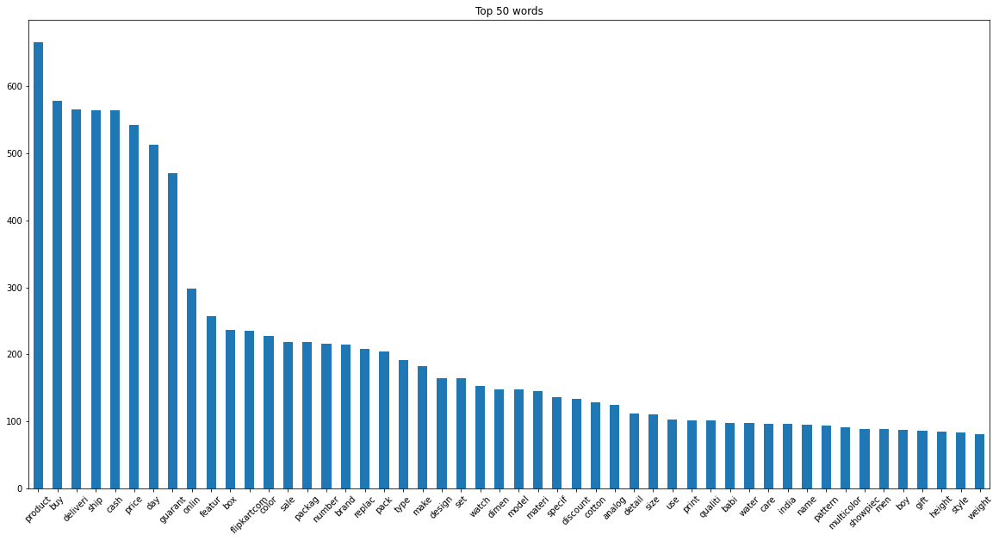

In [126]:
import matplotlib.pyplot as plt
import texthero                     as hero
NUM_TOP_WORDS = 50
top_50 = hero.visualization.top_words(data["description_short"]).head(NUM_TOP_WORDS)
# Draw the bar 
fig=plt.figure(figsize=(20,10))
top_50.plot.bar(rot=45, title="Top 50 words");
plt.show(block=True);

In [127]:
#Other Stop_words
other_words=['com','flipkart','ast906','buy','product',
             'shipping','free','delivery','cash','price',
             'best','replac','online','type','sale','number',
             'qualiti','specif','guarant','detail','inch',
             'price','size','made','use','india','ideal','chine',
             'color','ship',' guarante','replac ','packag','deliveri',
             'guarante','genuin','also','confort','make','one',
             'discount','content','perfect','analog','warranti','brand',
             'great','dimen', 'multicolor','adapt','width','give','black',
             'comfort','style','height','high','blue','shape','length',
             'round','weight','get','white','like','brown','green',
             'occa','red','onlin','indian','come','yellow',
             'pink','grey','love','happi','stay','flipkartcom','buy',
             'deliveri','featur','cash','day','color','brand','box',
             'pack']

In [128]:
def supp_other_words(text,other_words):
    nltk_tokens = nltk.word_tokenize(text)
    
    corpus = [word for word in nltk_tokens if word not in other_words]
    
    return ' '.join(map(str, corpus)) # Return the text untokenize

In [133]:
data["description_fin"] = data["description_short"].apply(lambda x: supp_other_words(x,other_words))
data["name_fin"] = data["name_short"].apply(lambda x: supp_other_words(x,other_words))

display(data.sample(5))
#test


,category,description,product_name,description_clean,name_clean,description_tokenized,name_tokenized,description_stopword,name_stopword,description_lemm,name_lemm,description_adv,name_adv,description_stem,name_stem,description_short,name_short,description_fin,name_fin
347,Beauty,Flipkart.com: Buy Nivea Fresh Power Boost Deo ...,Nivea Fresh Power Boost Deo Combo Combo Set,flipkartcom buy nivea fresh power boost deo co...,nivea fresh power boost deo combo combo set,flipkartcom buy nivea fresh power boost deo co...,nivea fresh power boost deo combo set,flipkartcom buy nivea fresh power boost deo co...,nivea fresh power boost deo combo set,flipkartcom buy nivea fresh power boost deo co...,nivea fresh power boost deo combo set,flipkartcom buy power boost deo combo set r pr...,power boost deo combo set,flipkartcom buy power boost deo combo set r pr...,power boost deo combo set,flipkartcom buy power boost deo combo set prod...,power boost deo combo set,power boost deo combo set,power boost deo combo set
643,Computers,Specifications of Intel 3.2 GHz LGA 1150 3250 ...,Intel 3.2 GHz LGA 1150 3250 Processor,specifications of intel ghz lga proce...,intel ghz lga processor,specifications of intel ghz lga processor blac...,intel ghz lga processor,specifications intel ghz lga processor black b...,intel ghz lga processor,specification intel ghz lga processor black bo...,intel ghz lga processor,specification intel ghz lga processor box sale...,intel ghz lga processor,specif intel ghz lga processor box sale packag...,intel ghz lga processor,specif intel ghz lga processor box sale packag...,intel ghz lga processor,intel ghz lga processor core memori support sp...,intel ghz lga processor
98,Beauty,Buy Kuber Industries Bangle Four Roll & Ring &...,Kuber Industries Bangle Four Roll & Ring & Ear...,buy kuber industries bangle four roll ring e...,kuber industries bangle four roll ring earin...,buy kuber industries bangle four roll ring ear...,kuber industries bangle four roll ring earing ...,buy kuber industries bangle four roll ring ear...,kuber industries bangle four roll ring earing ...,buy kuber industry bangle four roll ring earin...,kuber industry bangle four roll ring earing bo...,buy kuber industry bangle four roll ring earin...,kuber industry bangle four roll ring earing je...,buy kuber industri bangl four roll ring ear je...,kuber industri bangl four roll ring ear jewell...,buy kuber industri bangl four roll ring ear je...,kuber industri bangl four roll ring ear jewell...,kuber industri bangl four roll ring ear jewell...,kuber industri bangl four roll ring ear jewell...
214,Decor,Shoppingtara Paper Mache 3 Piece Elephant Home...,Shoppingtara Paper Mache 3 Piece Elephant Home...,shoppingtara paper mache piece elephant hom...,shoppingtara paper mache piece elephant hom...,shoppingtara paper mache piece elephant home d...,shoppingtara paper mache piece elephant home d...,shoppingtara paper mache piece elephant home d...,shoppingtara paper mache piece elephant home d...,shoppingtara paper mache piece elephant home d...,shoppingtara paper mache piece elephant home d...,paper mache piece home decor gift showpiece cm...,paper mache piece home decor gift showpiece cm,paper mach piec home decor gift showpiec cm mu...,paper mach piec home decor gift showpiec cm,paper mach piec home decor gift showpiec multi...,paper mach piec home decor gift showpiec,paper mach piec home decor gift showpiec handc...,paper mach piec home decor gift showpiec
218,Kitchen,Buy Apex Rolling Pizza Cutter for Rs.69 online...,Apex Rolling Pizza Cutter,buy apex rolling pizza cutter for online ap...,apex rolling pizza cutter,buy apex rolling pizza cutter for online at be...,apex rolling pizza cutter,buy apex rolling pizza cutter online best pric...,apex rolling pizza cutter,buy apex roll pizza cutter online best price f...,apex roll pizza cutter,buy roll pizza cutter online price ship cash d...,apex roll pizza cutter,buy roll pizza cutter onlin price ship cash de...,apex roll p

In [134]:
idex

450

#categorie#: Baby
#text originale#: Specifications of Upside Down Sleeveless Applique Baby Girl's, Baby Boy's Jacket General Details Ideal For Baby Girl's, Baby Boy's Pattern Applique Jacket Details Fabric Poly Cotton Reversible No Hooded No Closure Buttons Sleeve Sleeveless Lining Cotton Fabric Care Dont Wash With Other Garments, Hand Wash With Mild Detergent,Dont Tumble Dry, Dry In Shade. Additional Details Style Code LIGHT PINK SMILEY FACE JACKET Other Details Sleeveless In the Box 1 Jacket
#name originale#: Upside Down Sleeveless Applique Baby Girl's, Baby Boy's Jacket
#text celan#: specifications of upside down sleeveless applique baby girls baby boys jacket general details ideal for baby girls baby boys pattern applique jacket details fabric poly cotton reversible no hooded no closure buttons sleeve sleeveless lining cotton fabric care do not wash with other garments hand wash with mild detergentdo not tumble dry dry in shade additional details style code light pink smiley face j

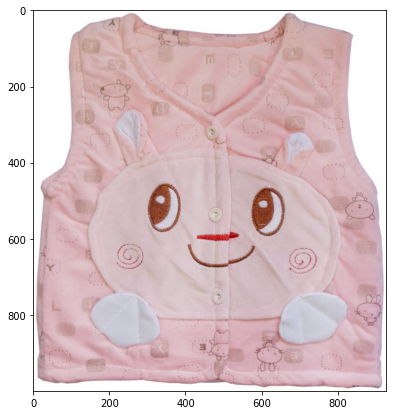

In [136]:
print('#categorie#:',data.category[idex])

print('#text originale#:',data.description[idex])
print('#name originale#:',data.product_name[idex])

print('#text celan#:',data.description_clean[idex])
print('#name celan#:',data.name_clean[idex])

print('#text final#  :',data['description_fin'][idex])
print('#name final#  :',data['name_fin'][idex])

from PIL import Image
from random import *

path = "/content/drive/MyDrive/Fatma Aidi/Parcours OCR/Data/Images/"
im = Image.open(path+flipkart.image[idex])

plt.figure(figsize=(7,7))
plt.imshow(im)

## Analyse Top words après traitement

**Top Words**

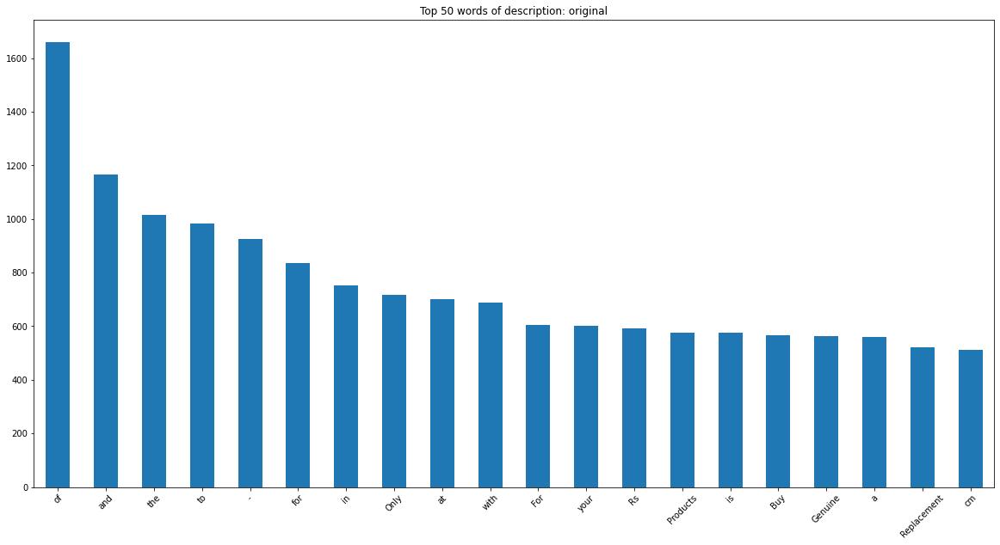

In [138]:
import matplotlib.pyplot as plt
NUM_TOP_WORDS = 20
top_50 = hero.visualization.top_words(data['description']).head(NUM_TOP_WORDS)
# Draw the bar 
fig=plt.figure(figsize=(20,10))
top_50.plot.bar(rot=45, title="Top 50 words of description: original");
plt.show(block=True);

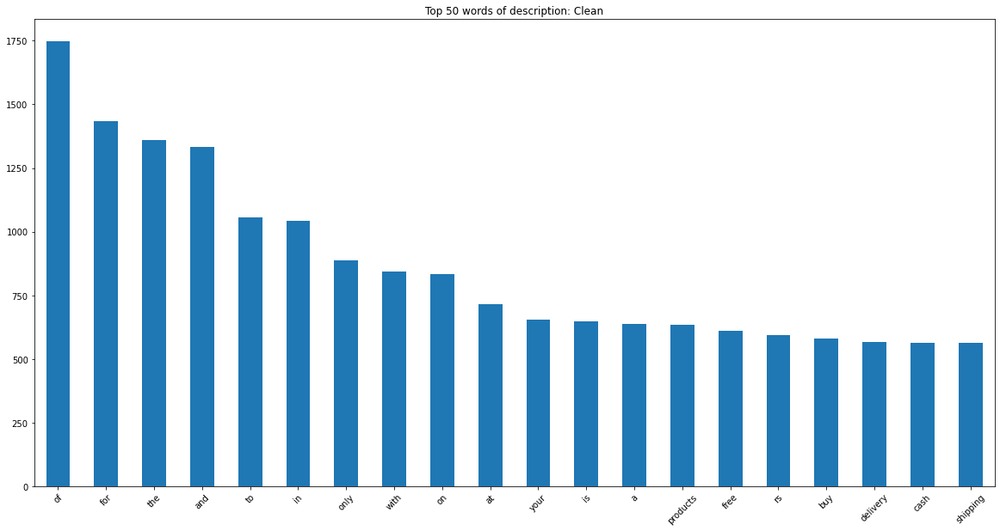

In [139]:
top_50 = hero.visualization.top_words(data['description_clean']).head(NUM_TOP_WORDS)
# Draw the bar 
fig=plt.figure(figsize=(20,10))
top_50.plot.bar(rot=45, title="Top 50 words of description: Clean");
plt.show(block=True);

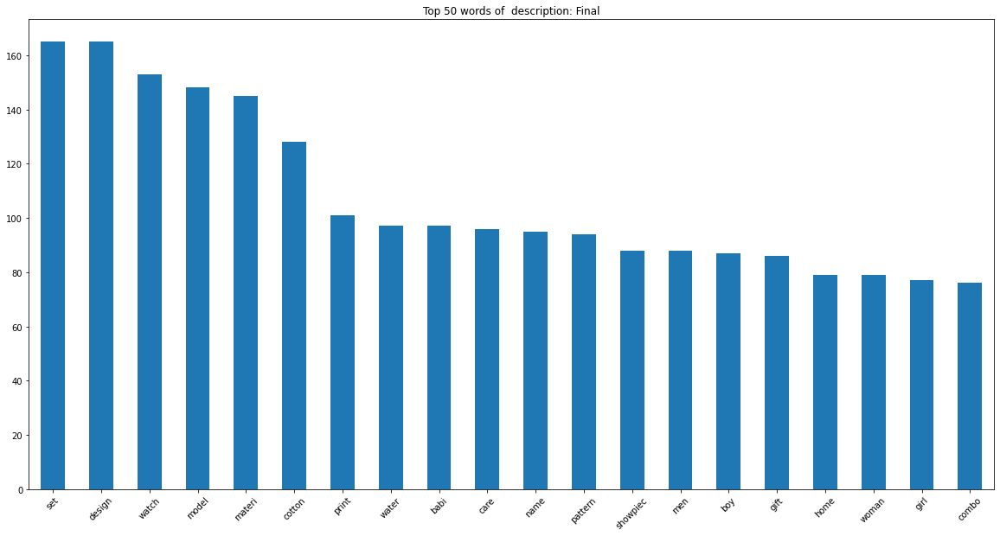

In [140]:
top_50 = hero.visualization.top_words(data['description_fin']).head(NUM_TOP_WORDS)
# Draw the bar 
fig=plt.figure(figsize=(20,10))
top_50.plot.bar(rot=45, title="Top 50 words of  description: Final");
plt.show(block=True);

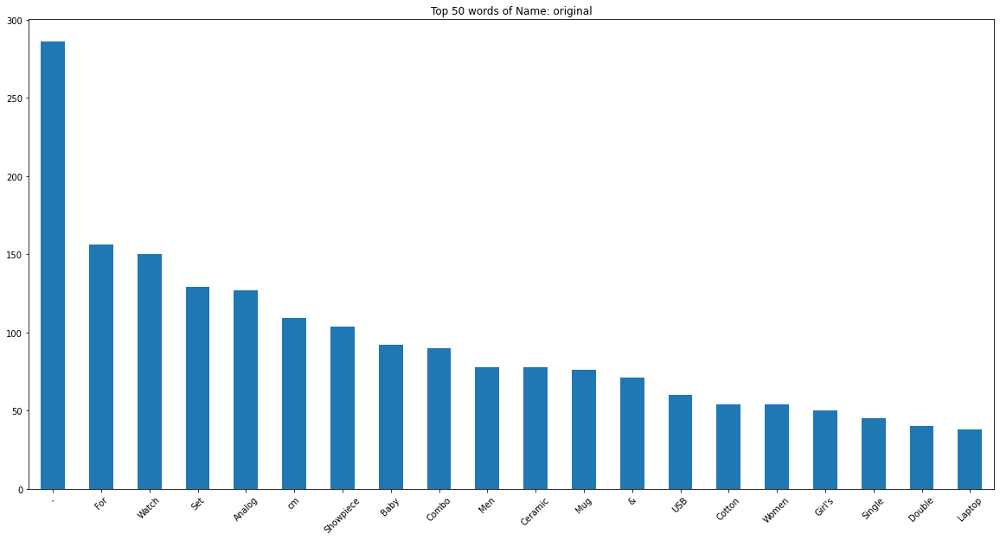

In [141]:
top_50 = hero.visualization.top_words(data['product_name']).head(NUM_TOP_WORDS)
# Draw the bar 
fig=plt.figure(figsize=(20,10))
top_50.plot.bar(rot=45, title="Top 50 words of Name: original");
plt.show(block=True);

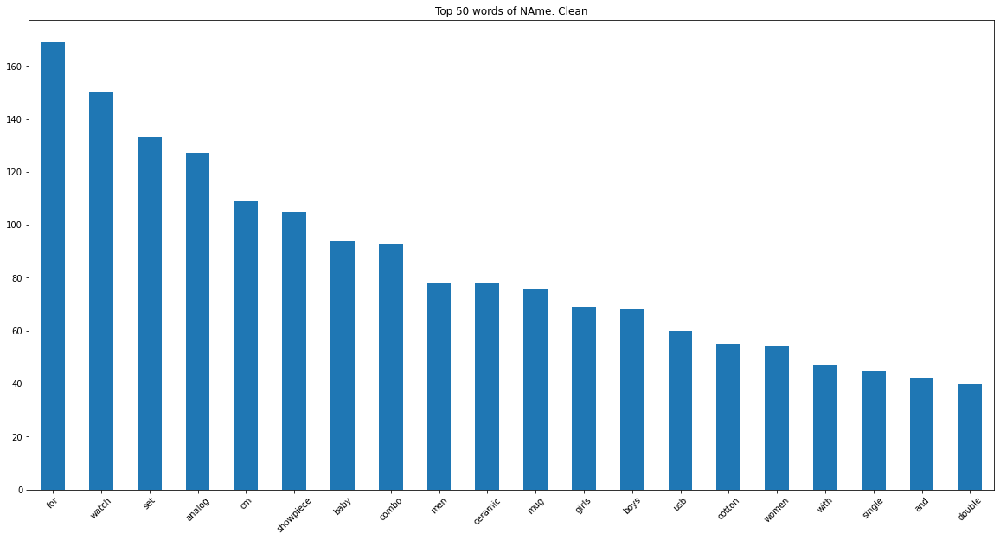

In [142]:
top_50 = hero.visualization.top_words(data['name_clean']).head(NUM_TOP_WORDS)
# Draw the bar 
fig=plt.figure(figsize=(20,10))
top_50.plot.bar(rot=45, title="Top 50 words of NAme: Clean");
plt.show(block=True);

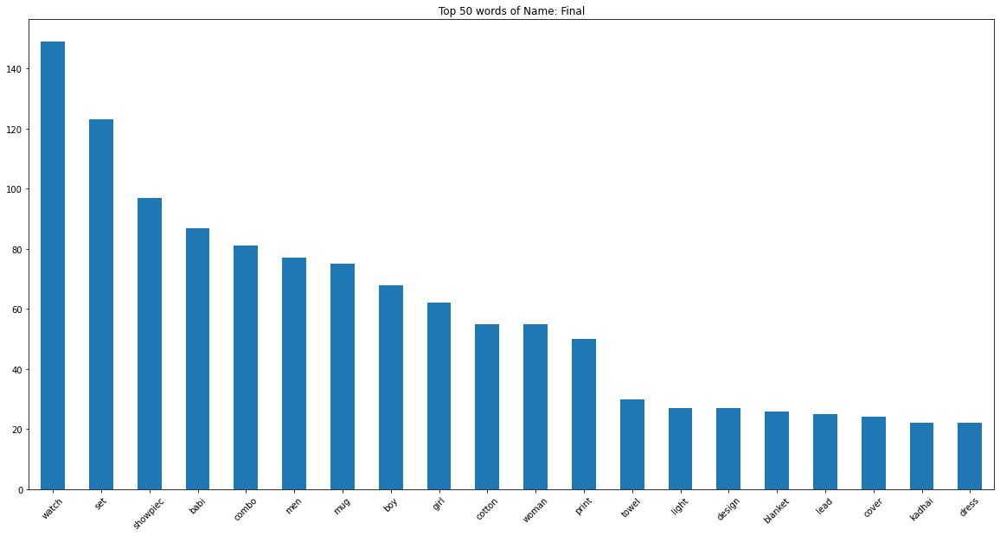

In [143]:
top_50 = hero.visualization.top_words(data['name_fin']).head(NUM_TOP_WORDS)
# Draw the bar 
fig=plt.figure(figsize=(20,10))
top_50.plot.bar(rot=45, title="Top 50 words of Name: Final");
plt.show(block=True);

**Wordcloud**

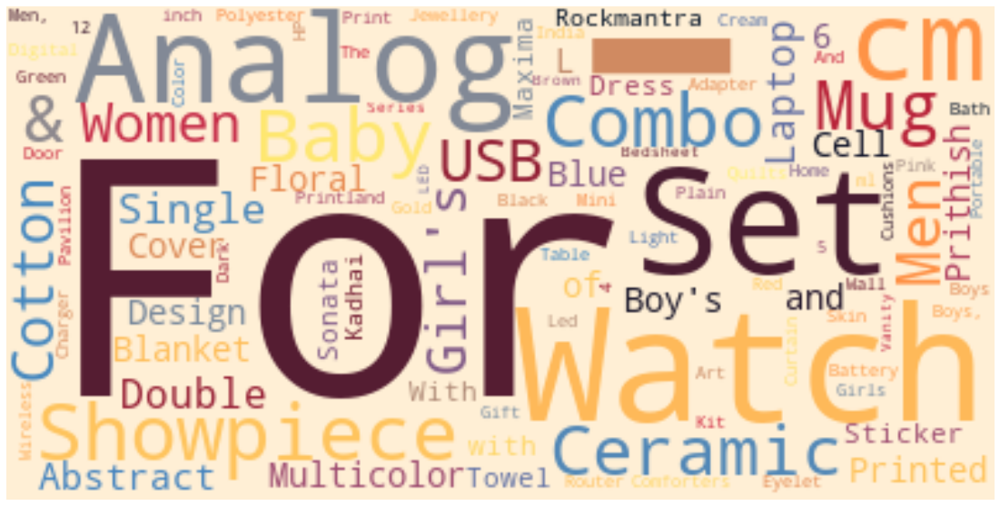

In [ ]:
hero.wordcloud(data.product_name, max_words=100,)

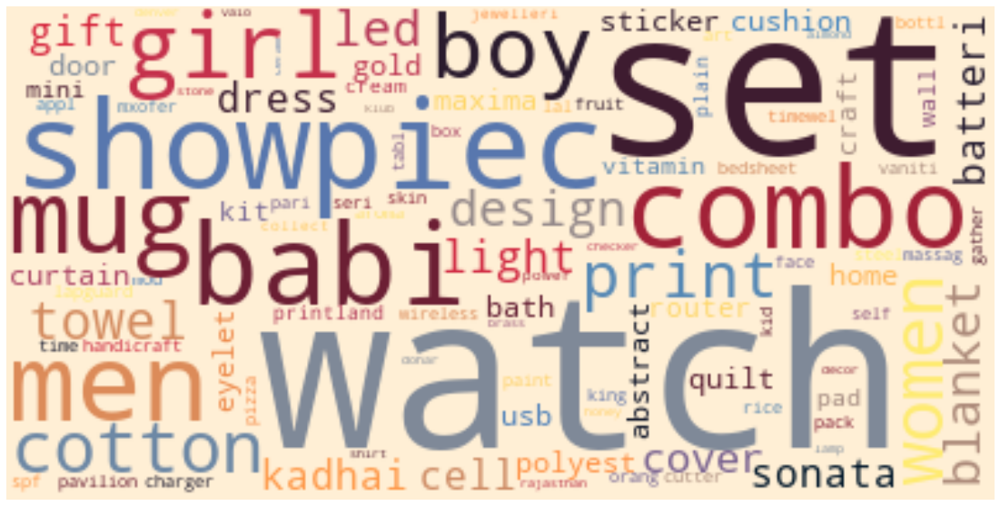

In [ ]:
#Plot wordcloud image using WordCloud method
hero.wordcloud(data.name_fin, max_words=100,)

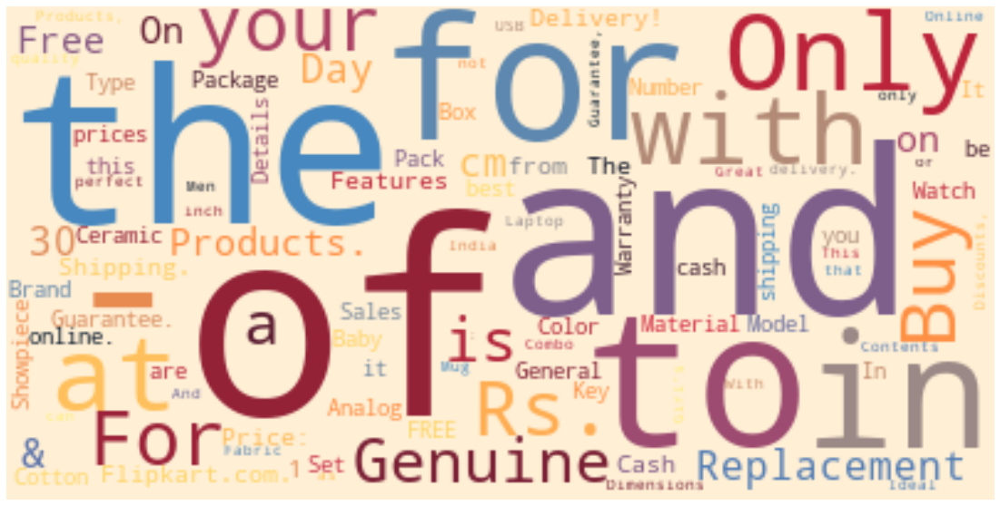

In [ ]:
hero.wordcloud(data.description, max_words=100,)

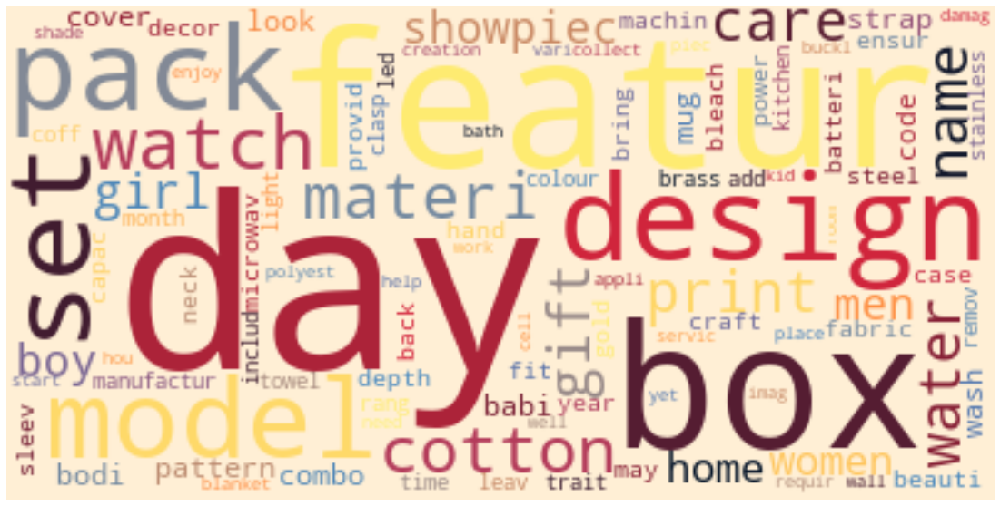

In [ ]:
#Plot wordcloud image using WordCloud method
hero.wordcloud(data.description_fin, max_words=100,)

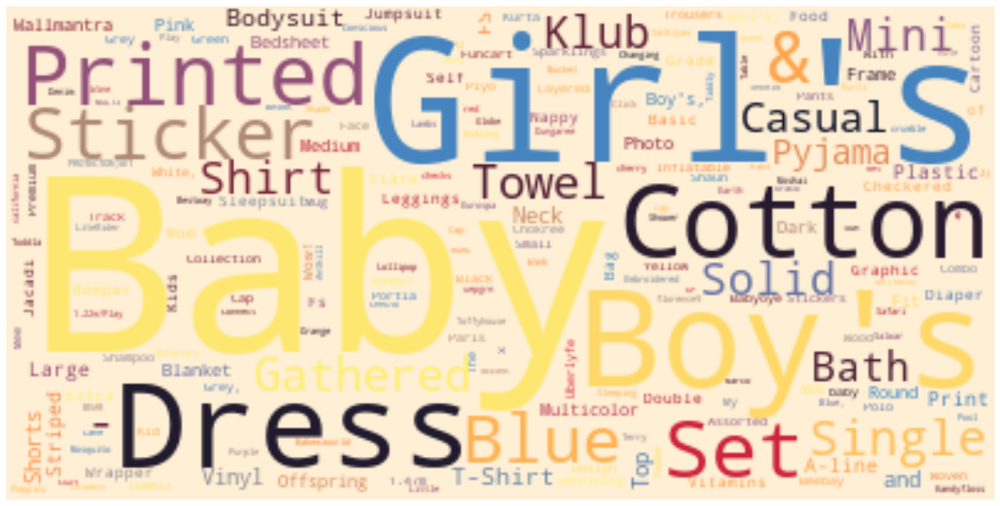

In [ ]:
#Plot wordcloud image using WordCloud method
hero.wordcloud(data[data['category']=='Baby']['product_name'], max_words=200,)

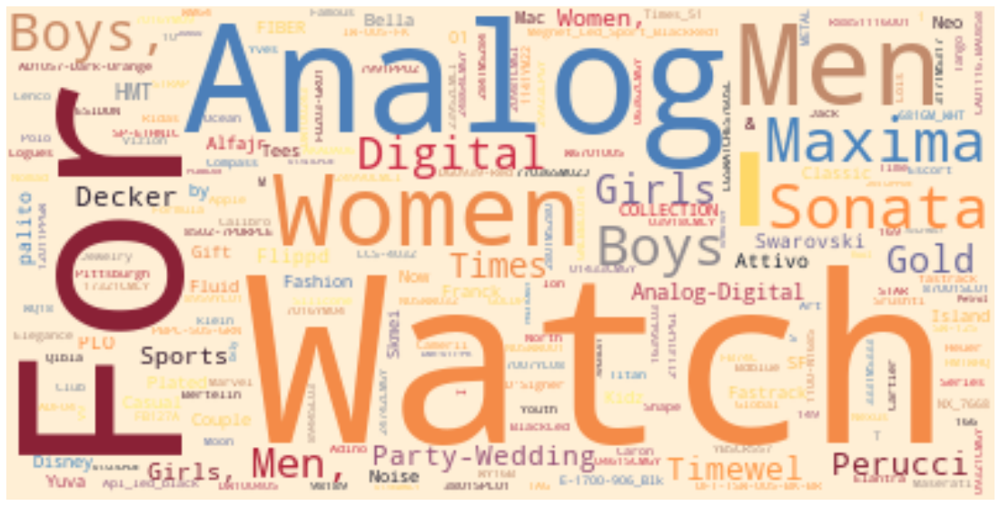

In [ ]:
#Plot wordcloud image using WordCloud method
hero.wordcloud(data[data['category']=='Watches']['product_name'], max_words=200,)

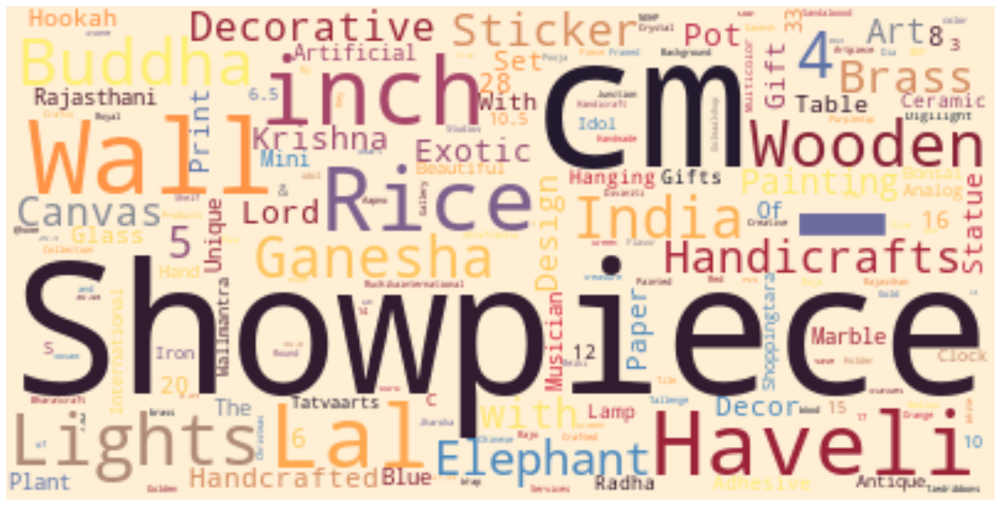

In [ ]:
#Plot wordcloud image using WordCloud method
hero.wordcloud(data[data['category']=='Decor']['product_name'], max_words=200,)

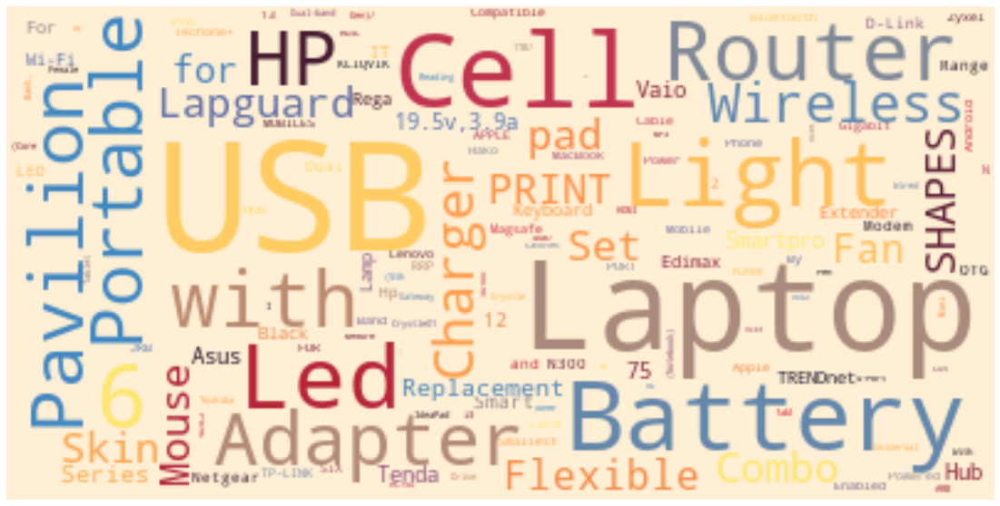

In [ ]:
#Plot wordcloud image using WordCloud method
hero.wordcloud(data[data['category']=='Computers']['product_name'], max_words=200,)

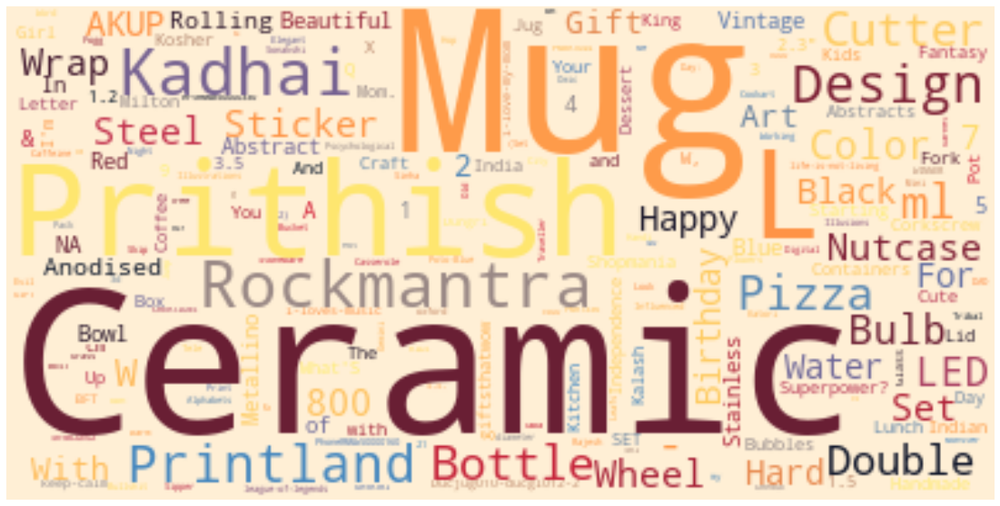

In [ ]:
#Plot wordcloud image using WordCloud method
hero.wordcloud(data[data['category']=='Kitchen']['product_name'], max_words=200,)

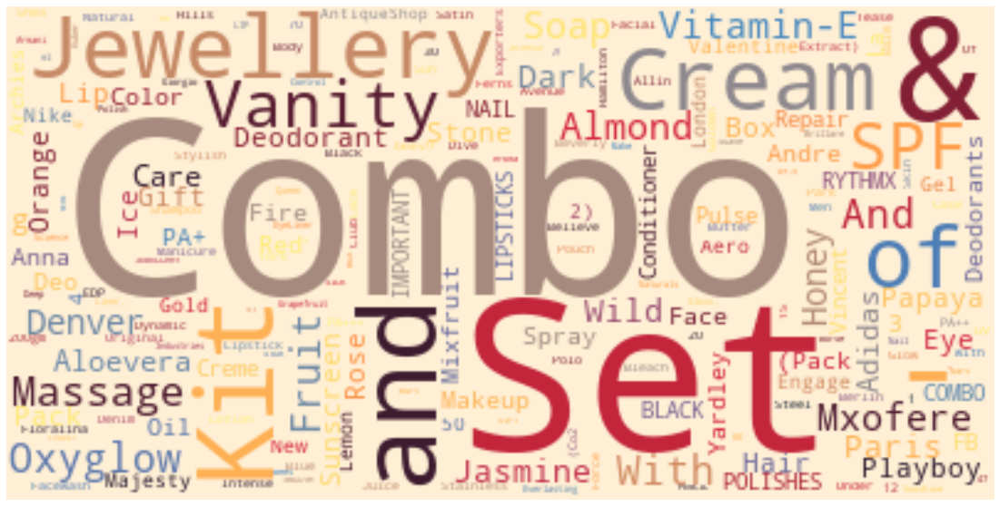

In [ ]:
#Plot wordcloud image using WordCloud method
hero.wordcloud(data[data['category']=='Beauty']['product_name'], max_words=200,)

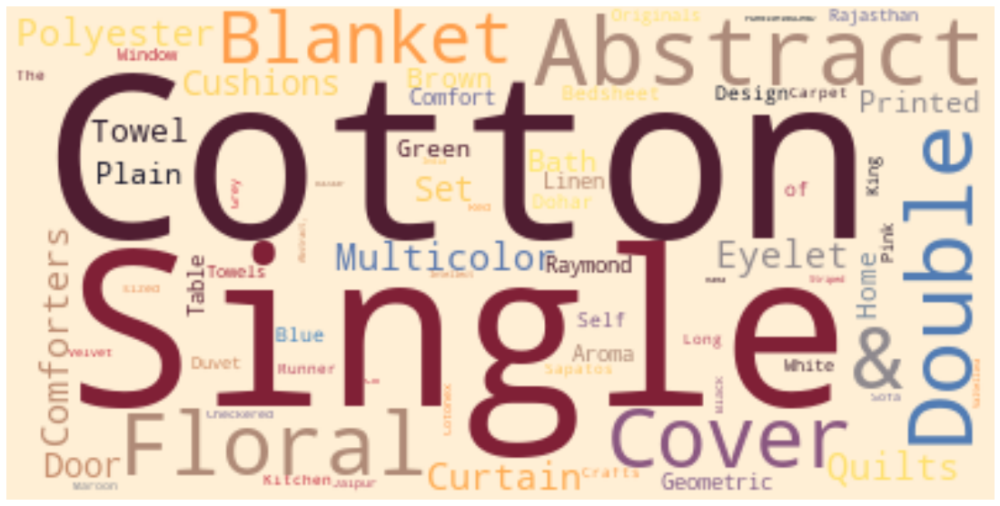

In [ ]:
#Plot wordcloud image using WordCloud method
hero.wordcloud(data[data['category']=='Home']['product_name'], max_words=200,)

# Feature extraction

In [ ]:

data['concat']=data['description_short']+' '+data['name_short']

In [ ]:
#test
text=data.description[700]
print('#text originale#:',text)
text_modifier=data['description_fin'][700]
print('#text modifié#  :',text_modifier)


#text originale#: Specifications of Vgstore Rectangular Pack of 6 Table Placemat (Dark Blue, PVC) General Brand Vgstore Shape Rectangular Design Code blstri Material PVC Style Code strblue Color Dark Blue In the Box Number of Contents in Sales Package Pack of 6
#text modifié#  : vgstore pack placemat dark pvc design code blstri strblue box


In [ ]:
#define vectorizer parameters
from sklearn.feature_extraction.text import CountVectorizer

def BOVW_TF(X,n_gram):
    tfidf_vectorizer = TfidfVectorizer(
        min_df=2,
        max_df=0.9,
        max_features=5000,
        ngram_range=n_gram)
    tf_vectorizer=CountVectorizer(
        min_df=2,
        max_df=0.9,
        max_features=5000,
        ngram_range=n_gram)
    # Generate matrix of word vectors
    # tf-idf (term frequency-inverse document frequency)
    tfidf_matrix = tfidf_vectorizer.fit_transform(X)
    tfidf_words = tfidf_vectorizer.get_feature_names()

    # bag of words (term frequency)
    tf_matrix=tf_vectorizer.fit_transform(X)
    tf_words = tf_vectorizer.get_feature_names()

    return tfidf_matrix,tf_matrix



In [ ]:
data['concat']=data['description_clean']+' '+data['name_clean']
X = data['name_clean'].copy()
X2=data['name_fin'].copy()

tfidf_matrix_N,tf_matrix_N=BOVW_TF(data['name_clean'].copy(),n_gram=(1,2))
tfidf_matrix_NF,tf_matrix_NF=BOVW_TF(data['name_fin'].copy(),n_gram=(1,2))

tfidf_matrix_D,tf_matrix_D=BOVW_TF(data['description_clean'].copy(),n_gram=(1,1))
tfidf_matrix_DF,tf_matrix_DF=BOVW_TF(data['description_fin'].copy(),n_gram=(1,1))


word2vec est une sorte d’ACP non linéaire en ce sens qu’il réduit les dimensions. Il faut lire Analyse en composantes principales (ACP) et Auto Encoders pour comprendre le lien entre ACP, ACP non linéaire, réseaux de neurones diabolo et compression. word2vec est plus d’une ACP non linéaire car il prend en compte le contexte mais ne s’en éloigne pas tant que ce ça

**Réduction de démension**

In [ ]:

from sklearn.decomposition import SparsePCA
from umap import UMAP
from sklearn.manifold import TSNE



def plot_tsne_pca(matrix,title,labels):

# Dimensionality reduction using PCA,
     # reduce the tfidf matrix to just 2 features

    pca = PCA(n_components=2,
              random_state=5).fit_transform(matrix)
    tsne_pca = TSNE().fit_transform(PCA(n_components=3).fit_transform(matrix))
    tsne = TSNE(n_components=2,
              random_state=5).fit_transform(matrix)   
    #attaching the label to each 2D projection
    pca_data=np.vstack((pca.T,labels)).T
    pca_df=pd.DataFrame(pca_data,
                        columns=['pca-one','pca-two','category'])

    tsne_data=np.vstack((tsne.T,labels)).T
    tsne_df=pd.DataFrame(tsne_data,
                         columns=['tsne-one','tsne-two','category'])

    
    
    idx = np.random.choice(range(pca.shape[0]), 
                           size=500, replace=False)
    
    f, ax = plt.subplots(1, 2, figsize=(14, 6))


    sns.scatterplot(data=pca_df,
                    x="pca-one",
                    y="pca-two",
                    hue='category',
                    ax=ax[0])
    ax[0].set_title('PCA Cluster Plot'+' '+title)
    

    sns.scatterplot(data=tsne_df,
                    x="tsne-one",
                    y="tsne-two",
                    hue='category',
                    ax=ax[1])
    ax[1].set_title('TSNE Cluster Plot'+' '+title)
    



In [ ]:
pip install umap-learn


     |████████████████████████████████| 81kB 4.5MB/s 
     |████████████████████████████████| 1.2MB 13.2MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.1-cp37-none-any.whl size=76569 sha256=a0b81f9f7887f1ece78392ee37157bc5d6ead472c33a0da9cb01358de49aca92
  Stored in directory: /root/.cache/pip/wheels/ad/df/d5/a3691296ff779f25cd1cf415a3af954b987fb53111e3392cf4
  Created wheel for pynndescent: filename=pynndescent-0.5.2-cp37-none-any.whl size=51351 sha256=6a5109aa5f3dda147d3513bcfc85800913c8a64a3e0e7877c221e6c96a3b7823
  Stored in directory: /root/.cache/pip/wheels/ba/52/4e/4c28d04d144a28f89e2575fb63628df6e6d49b56c5ddd0c74e
Successfully built umap-learn pynndescent


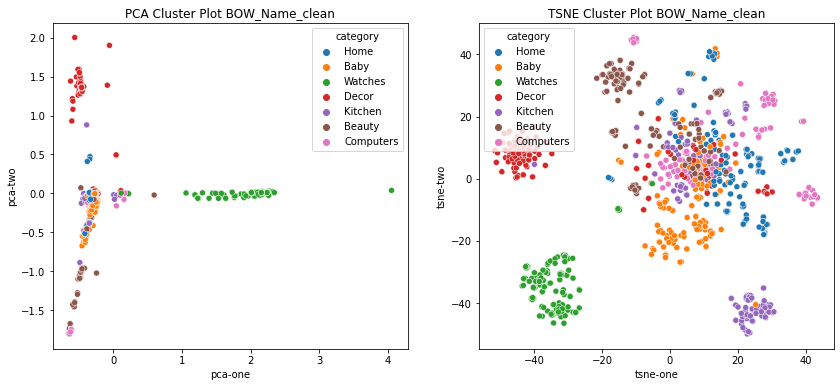

In [ ]:
plot_tsne_pca(tf_matrix_N.todense(),'BOW_Name_clean',data['category'])

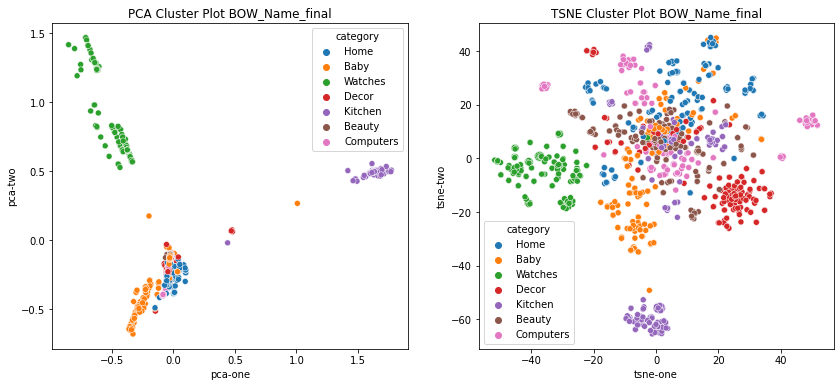

In [ ]:
plot_tsne_pca(tf_matrix_NF.todense(),'BOW_Name_final',data['category'])

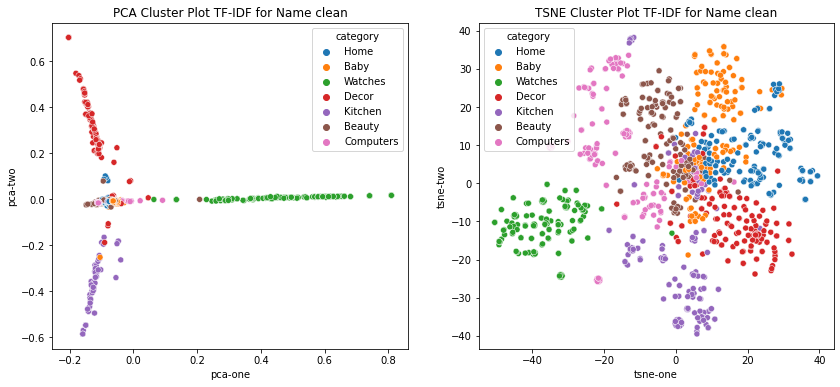

In [ ]:
plot_tsne_pca(tfidf_matrix_N.todense(),'TF-IDF for Name clean',data['category'])

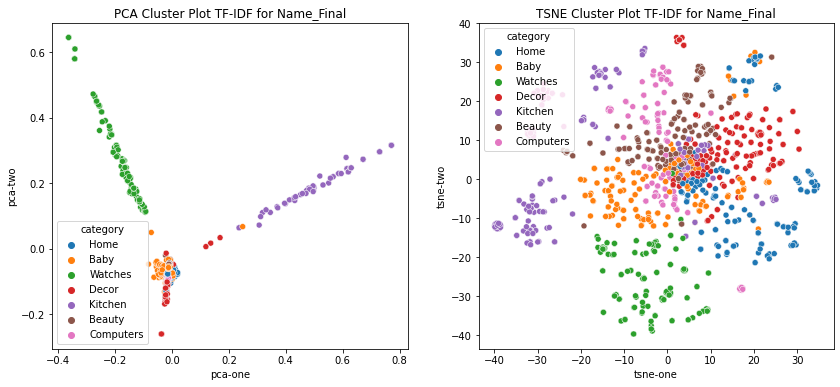

In [ ]:
plot_tsne_pca(tfidf_matrix_NF.todense(),'TF-IDF for Name_Final',data['category'])

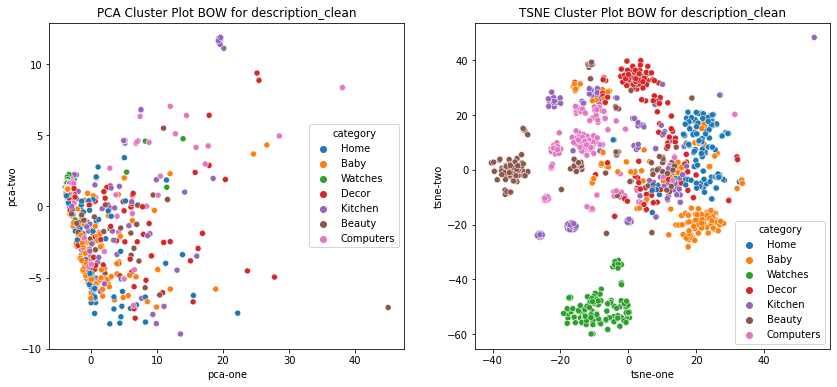

In [ ]:
plot_tsne_pca(tf_matrix_D.todense(),'BOW for description_clean',data['category'])

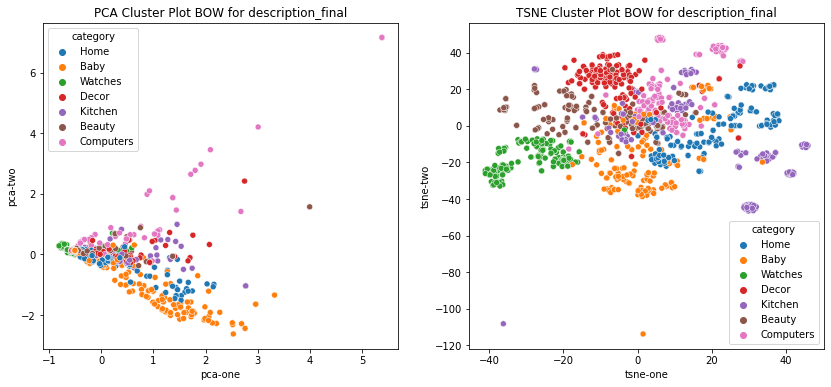

In [ ]:
plot_tsne_pca(tf_matrix_DF.todense(),'BOW for description_final',data['category'])

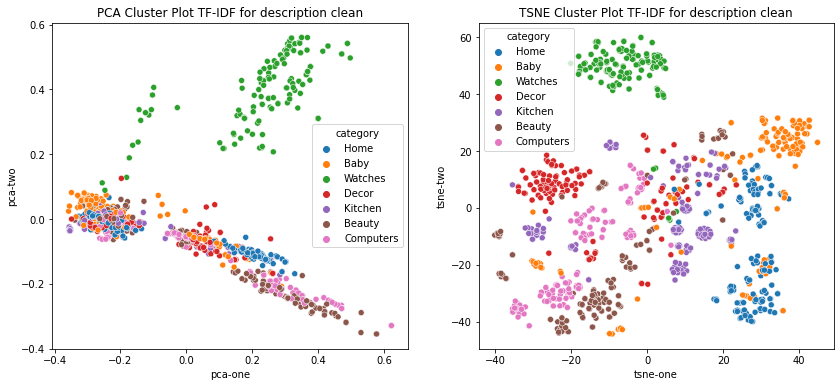

In [ ]:
plot_tsne_pca(tfidf_matrix_D.todense(),'TF-IDF for description clean',data['category'])

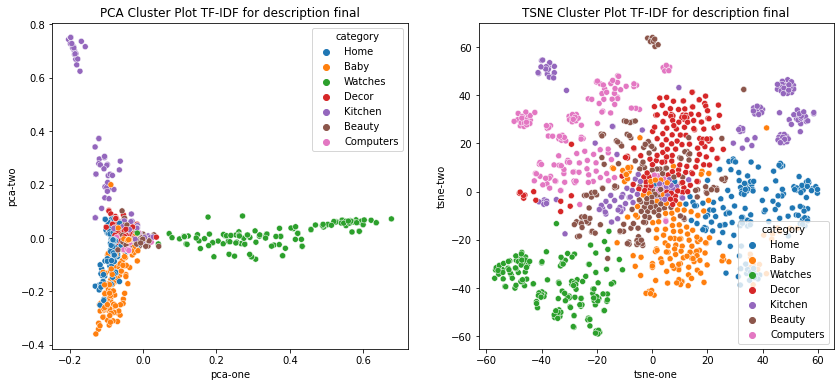

In [ ]:
plot_tsne_pca(tfidf_matrix_DF.todense(),'TF-IDF for description final',data['category'])

http://www.xavierdupre.fr/app/papierstat/helpsphinx/notebooks/text_sentiment_wordvec.html#word2vec

In [ ]:
from gensim.models import Word2Vec
from gensim.utils import tokenize
sentance = [list(tokenize(s, deacc=True, lower=True)) for s in X]
print(sentance[0])
model = Word2Vec(sentance,
                 min_count=1,)
model.corpus_count

['elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain']


1050

In [ ]:
vocab = model.wv.vocab
list(vocab)[:15]


['elegance',
 'polyester',
 'multicolor',
 'abstract',
 'eyelet',
 'door',
 'curtain',
 'sathiyas',
 'cotton',
 'bath',
 'towel',
 'eurospa',
 'terry',
 'face',
 'set']

In [ ]:
def get_vect(word, model):
    try:
        return model.wv[word]
    except KeyError:
        return np.zeros((model.vector_size,))

def sum_vectors(phrase, model):
    return sum(get_vect(w, model) for w in phrase)

def word2vec_features(X, model):
    feats = np.vstack([sum_vectors(p, model) for p in X])
    return feats

X_emb_N = word2vec_features(data['name_clean'].copy(), model)
X_emb_NF = word2vec_features(data['name_fin'].copy(), model)

X_emb_D = word2vec_features(data['description_clean'], model)
X_emb_DF = word2vec_features(data['description_fin'].copy(), model)

X_emb_N.shape

(1050, 100)

# Clustering

In [ ]:

k=7#nbr of cluster
def kmeans_clustering(tfidf_matrix,tf_matrix,X_emb,k):

    nmf = NMF(n_components=k)
    nmf_matrix = nmf.fit_transform(tfidf_matrix)


    lda = LatentDirichletAllocation(k, learning_method='batch')
    lda_tf = lda.fit_transform(tf_matrix)

    # Singular Value Decomposition
    lsa = TruncatedSVD(n_components=100)

    matrix1=tfidf_matrix.copy()
    matrix2=tf_matrix.copy()

    lsa_tfidf = lsa.fit_transform(matrix1)
    lsa_tf = lsa.fit_transform(matrix2)
    # initialize standardscaler
    from sklearn.preprocessing import StandardScaler
    from sklearn.preprocessing import Normalizer,MinMaxScaler

    SS = Normalizer()

    # transform my reducer data using standardscaler

    #tfidf=SS.fit_transform(X)
    #tf=SS.fit_transform(Y)
    #lsa_tfidf_std = SS.fit_transform(lsa_matrix_tfidf)
    #lsa_tf_std = SS.fit_transform(lsa_matrix_tf)
    #nmf_tfidf_std = SS.fit_transform(nmf_matrix)
    #lda_tf_std = SS.fit_transform(lda_matrix)
    #X_emb_std=SS.fit_transform(X_emb)
    km_tfidf = KMeans(n_clusters = k,init = 'random'
                          , n_init = 50, random_state = 20
                          , algorithm = 'full').fit(tfidf_matrix) 
    km_tf = KMeans(n_clusters = k,init = 'random'
                          , n_init = 50, random_state = 20
                          , algorithm = 'full').fit(tf_matrix)
    km_nmf =KMeans(n_clusters = k,init = 'random'
                          , n_init = 50, random_state = 20
                          , algorithm = 'full').fit(nmf_matrix)    
    km_lsa_tf = KMeans(n_clusters = k,init = 'random'
                          , n_init = 50, random_state = 20
                          , algorithm = 'full').fit(lsa_tfidf)# LSA-based k-means 
    km_lsa_tfidf = KMeans(n_clusters = k,init = 'random'
                          , n_init = 50, random_state = 20
                          , algorithm = 'full').fit(lsa_tf) 
    km_lda = KMeans(n_clusters = k,init = 'random'
                          , n_init = 50, random_state = 20
                          , algorithm = 'full').fit(lda_tf)       
    km_emb = KMeans(n_clusters = k,init = 'random'
                          , n_init = 50, random_state = 20
                          , algorithm = 'full').fit(X_emb)   # embr based k-means   

    return nmf_matrix,lda_tf,km_tfidf,km_tf,km_nmf,km_lsa_tf,km_lsa_tfidf,km_lda,km_emb
       

In [ ]:
nmf_matrix_N,lda_tf_N,km_tfidf_N,km_tf_N,km_nmf_N,km_lsa_tf_N,km_lsa_tfidf_N,km_lda_N,km_emb_N=kmeans_clustering(tfidf_matrix_N,tf_matrix_N,X_emb_N,k=7)
nmf_matrix_NF,lda_tf_NF,km_tfidf_NF,km_tf_NF,km_nmf_NF,km_lsa_tf_NF,km_lsa_tfidf_NF,km_lda_NF,km_emb_NF=kmeans_clustering(tfidf_matrix_NF,tf_matrix_NF,X_emb_NF,k=7)


In [ ]:
nmf_matrix_D,lda_tf_D,km_tfidf_D,km_tf_D,km_nmf_D,km_lsa_tf_D,km_lsa_tfidf_D,km_lda_D,km_emb_D=kmeans_clustering(tfidf_matrix_D,tf_matrix_D,X_emb_D,k=7)
nmf_matrix_DF,lda_tf_DF,km_tfidf_DF,km_tf_DF,km_nmf_DF,km_lsa_tf_DF,km_lsa_tfidf_DF,km_lda_DF,km_emb_DF=kmeans_clustering(tfidf_matrix_DF,tf_matrix_DF,X_emb_DF,k=7)


In [ ]:
def data_cluster(nmf_matrix,lda_tf,km_tfidf,km_tf,km_nmf,km_lsa_tf,km_lsa_tfidf,km_lda,km_emb):
  df = pd.DataFrame(columns=['cluster_nmf',
                            'cluster_lda', 
                            'cluster_nmf_km',
                            'cluster_lda_km',
                            'cluster_lsa_tfidf',
                            'cluster_lsa_tf',
                            'cluster_emb',
                            'cluster_tfidf',
                            'cluster_tf',], index=range(1050))
  df['cluster_nmf']=pd.DataFrame(nmf_matrix).idxmax(axis = 1)
  df['cluster_lda']=pd.DataFrame(lda_tf).idxmax(axis = 1)
  df['cluster_nmf_km']=km_nmf.labels_
  df['cluster_lda_km']=km_lda.labels_
  df['cluster_lsa_tfidf']=km_lsa_tfidf.labels_
  df['cluster_lsa_tf']=km_lsa_tf.labels_
  df['cluster_emb']=km_emb.labels_
  df['cluster_tfidf']=km_tfidf.labels_
  df['cluster_tf']=km_tf.labels_
  return df

In [ ]:
df_name=data_cluster(nmf_matrix_N,lda_tf_N,km_tfidf_N,km_tf_N,km_nmf_N,km_lsa_tf_N,km_lsa_tfidf_N,km_lda_N,km_emb_N)
df_name_final=data_cluster(nmf_matrix_NF,lda_tf_NF,km_tfidf_NF,km_tf_NF,km_nmf_NF,km_lsa_tf_NF,km_lsa_tfidf_NF,km_lda_NF,km_emb_NF)
df_desc=data_cluster(nmf_matrix_D,lda_tf_D,km_tfidf_D,km_tf_D,km_nmf_D,km_lsa_tf_D,km_lsa_tfidf_D,km_lda_D,km_emb_D)
df_desc_final=data_cluster(nmf_matrix_DF,lda_tf_DF,km_tfidf_DF,km_tf_DF,km_nmf_DF,km_lsa_tf_DF,km_lsa_tfidf_DF,km_lda_DF,km_emb_DF)

In [ ]:

def Ari_score (df,label,label_tru):
  cluster  = {0:'Baby',
            1:'Decor',
            2:'Computers',
            3:'Watches',
            4:'Kitchen',
            5:'Home',
            6:'Beauty'}

  # Prep
  k_labels = df[label].map(cluster)  # Get cluster labels
  k_labels_matched = np.empty_like(k_labels)

  # For each cluster label...
  for k in np.unique(k_labels):

    # ...find and assign the best-matching truth label
    match_nums = [np.sum((k_labels==k)*(label_tru==t)) for t in np.unique(label_tru)]
    k_labels_matched[k_labels==k] = np.unique(label_tru)[np.argmax(match_nums)]
  #confusion_matrix
  conf_mat = confusion_matrix(label_tru, k_labels_matched)

  #compute ARI SCORE
  ari_score=adjusted_rand_score(label_tru, k_labels_matched)
  homogeneity=homogeneity_score(label_tru, k_labels_matched)

  return ari_score,homogeneity

In [ ]:
def data_ari(df,Title):
    liste=['cluster_nmf','cluster_lda','cluster_nmf_km','cluster_lda_km',
          'cluster_lsa_tfidf','cluster_lsa_tf','cluster_emb','cluster_tfidf',
          'cluster_tf']

    ARI=[]
    for cluster in liste:
      ari,homg=Ari_score (df,cluster,
                            data['category'])
      ARI.append([ari,homg])


    df_ari=pd.DataFrame(ARI
                        ,index=['cluster_nmf','cluster_lda',
                        'nmf_km','lda_km',
                        'lsa_tfidf_km','lsa_tf_km',
                        'emb_km',
                        'tfidf_km',
                        'tf_km'],
                        columns=['ARI_SCORE','Homogeneity_score'])
    
  
    #display scores of  each Scaler

    tab_score=df_ari.round(3)

    #plot bar each Scaler 
    barWidth = 0.25# the width of the bars

    r1 = np.arange(len(tab_score))
    r2 = [x + barWidth for x in r1]
    fig, ax = plt.subplots(figsize=(12,7))

    rec1=ax.bar(r1,
                tab_score['ARI_SCORE'],
                color='darkorange',
                width=barWidth,
                label='ARI_SCORE')
    rec2=ax.bar(r2,
                tab_score['Homogeneity_score'],
                color='teal',
                width=barWidth,
                label='Homogeneity_score')

    for rect in rec1 :
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2., 1*height,
                '{:1.2f}'.format(height),
                ha='center', va='bottom')
    for rect in rec2 :
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2., 1*height,
                '{:1.2f}'.format(height),
                ha='center', va='bottom')
    # add some text for labels, title and axes ticks
    ax.set_title('Comparaison des performances Kmeans'+' '+Title, fontsize = 20)
    ax.set_xlabel('Models', fontsize = 15)
    ax.set_ylabel('Scores', fontsize = 15)
    ax.set_ylim(top=1)
    plt.xticks(r1, tab_score.index)
    ax.legend()
    plt.show()

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' oper

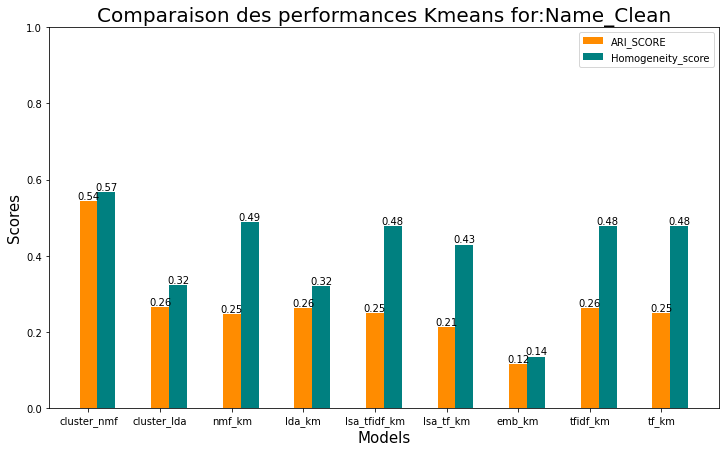

In [ ]:
data_ari(df_name,'for:Name_Clean')

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' oper

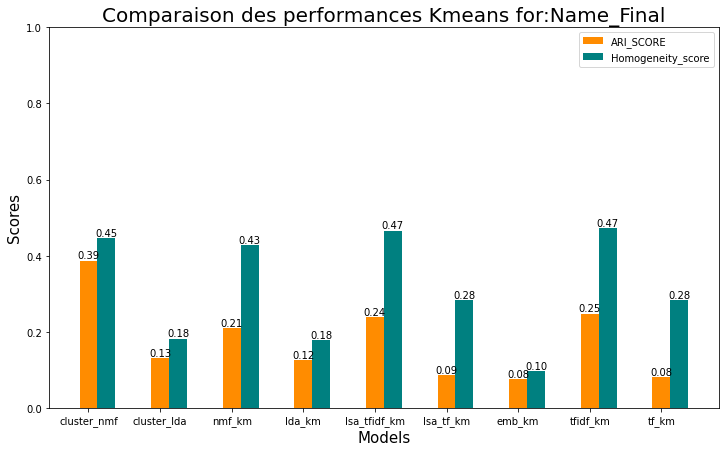

In [ ]:
data_ari(df_name_final,'for:Name_Final')

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' oper

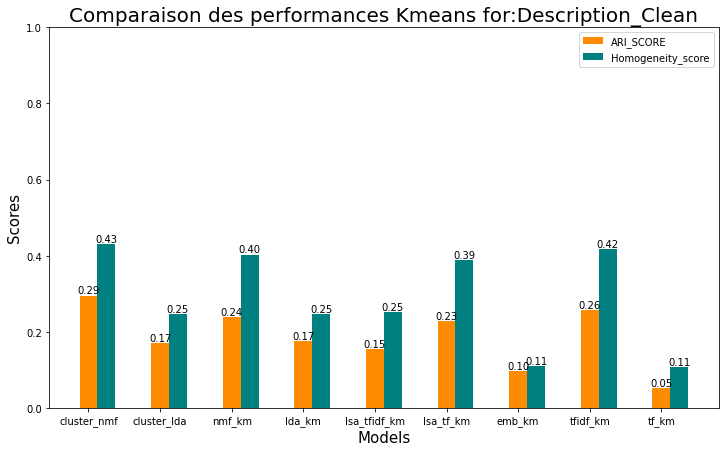

In [ ]:
data_ari(df_desc,'for:Description_Clean')

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead

/usr/local/lib/python3.7/dist-packages/pandas/core/computation/expressions.py:204: UserWarning:

evaluating in Python space because the '*' oper

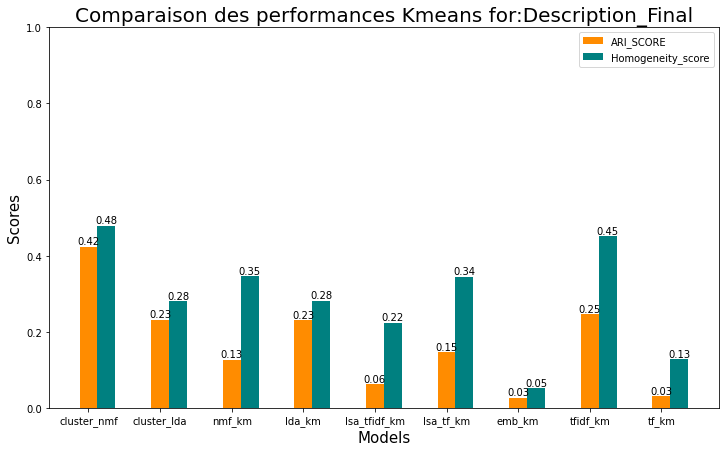

In [ ]:
data_ari(df_desc_final,'for:Description_Final')

# Evaluation des clusters

In [ ]:
NUM_TOP_WORDS = 10
def bar_cluster_(df,NUM_TOP_WORDS,cluster):

  top_50_1 = hero.visualization.top_words(df).head(NUM_TOP_WORDS)

  # Draw the bar 
  fig=plt.figure(figsize=(20,10))
  top_50_1.plot.bar(rot=0, title="Top 50 words"+' '+cluster)
  plt.show(block=True);

In [ ]:
data['cluster']=df_name['cluster_nmf']
data[['name_clean','category','cluster']].sample(4)

,name_clean,category,cluster
195,s c handicrafts sandalwood carved chinese quee...,Decor,1
177,printland ceramic mug,Kitchen,2
888,trident cotton face towel,Home,5
577,maxima analog watch for women,Watches,0


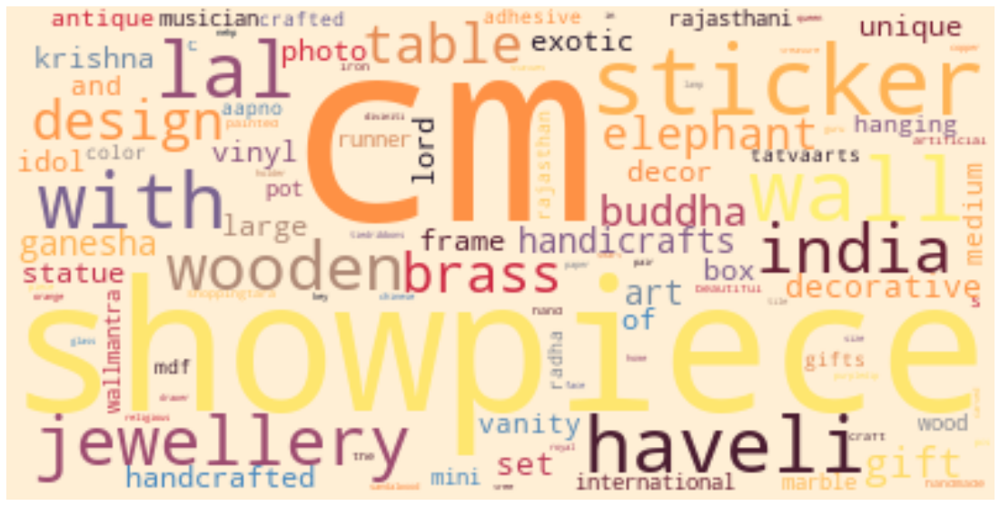

In [ ]:
#Plot wordcloud image using WordCloud method
hero.wordcloud(data[data.cluster==1]['name_clean'], max_words=100,)

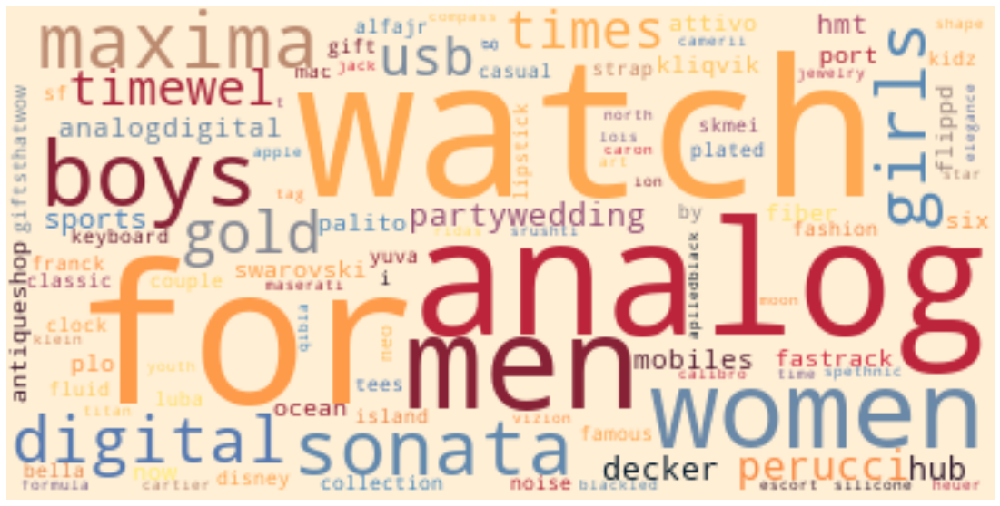

In [ ]:
hero.wordcloud(data[data.cluster==0]['name_clean'], max_words=100,)

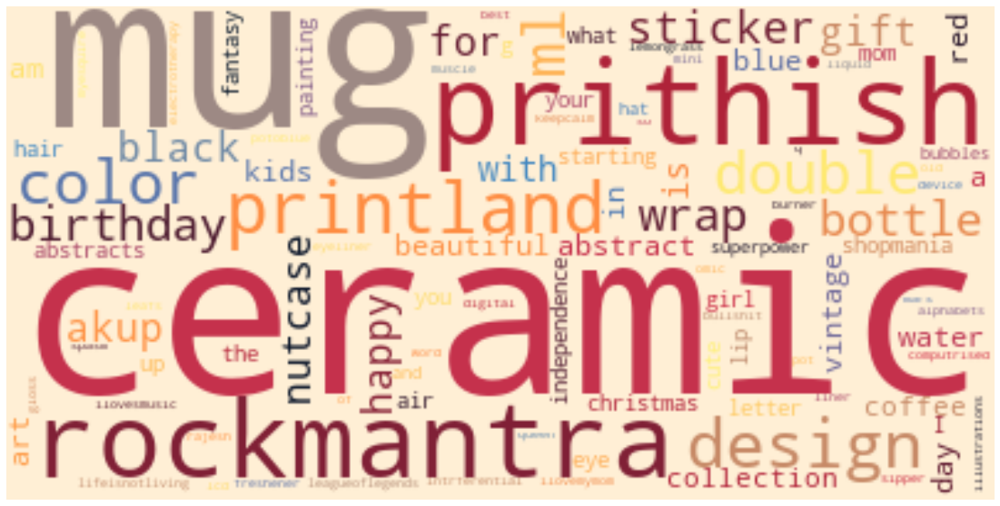

In [ ]:
hero.wordcloud(data[data.cluster==2]['name_clean'], max_words=100,)

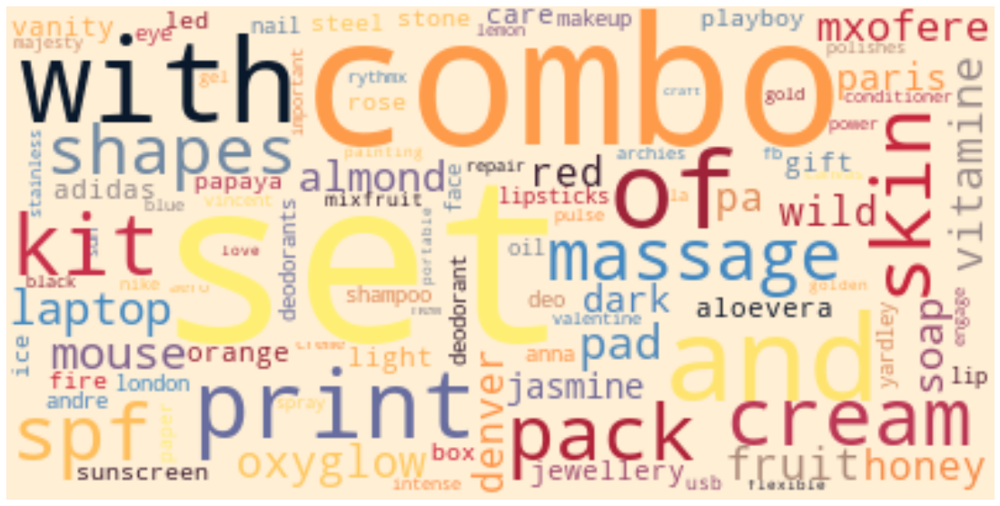

In [ ]:
hero.wordcloud(data[data.cluster==3]['name_clean'], max_words=100,)

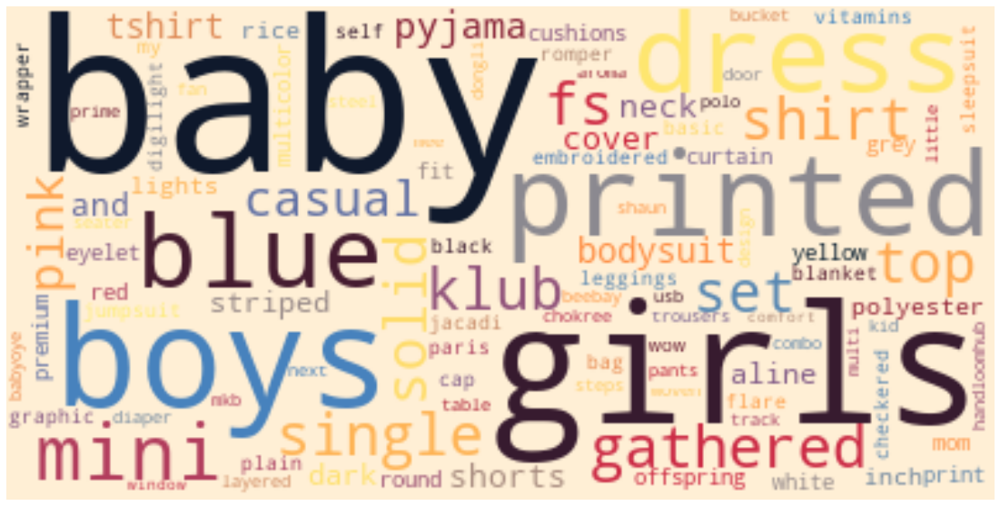

In [ ]:
hero.wordcloud(data[data.cluster==4]['name_clean'], max_words=100,)

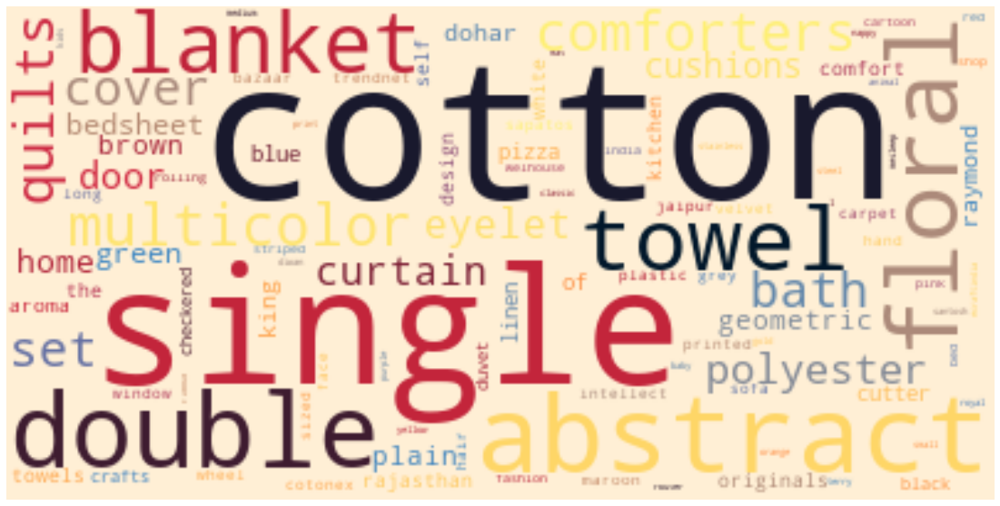

In [ ]:
hero.wordcloud(data[data.cluster==5]['name_clean'], max_words=100,)

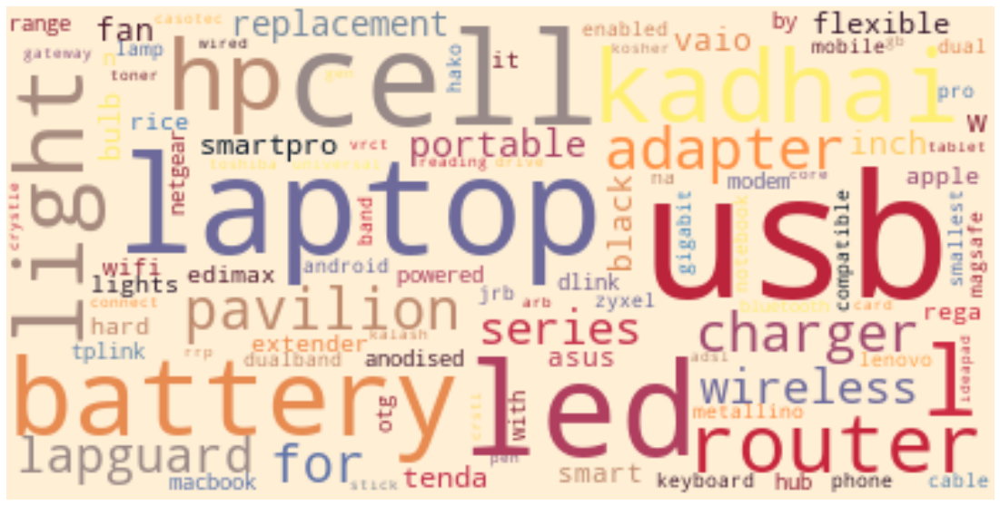

In [ ]:
hero.wordcloud(data[data.cluster==6]['name_clean'], max_words=100,)

In [ ]:
from sklearn.metrics import make_scorer,adjusted_rand_score
from sklearn.model_selection import GridSearchCV

#nombre de cluster
n_clusters=7

#initier le modèle kmeans avec les parametres defaut
km=KMeans(n_clusters=n_clusters)
#le score à optimiser
score=make_scorer(adjusted_rand_score)
#les hyperparametres à optimiser
parameters = {'init':('k-means++', 'random'),
              'max_iter':[50,100,120],#Nombre de fois où l'algorithme k-means sera exécuté avec différentes valeurs de centroïde. Les résultats finaux seront la meilleure sortie de n_init exécutions consécutives en termes d'inertie.
              'n_init':[5,10,15],#Nombre maximum d'itérations de l'algorithme k-means pour une seule exécution.
              'algorithm':['auto', 'full', 'elkan'],#Algorithme K-means à utiliser
              'random_state': [20,25,30,40,60,]}#Détermine la génération de nombres aléatoires pour l'initialisation du centre de gravité. Utilisez un int pour rendre le caractère aléatoire déterministe

#recherche sur gride

grid = GridSearchCV(km, parameters,scoring=score)
grid.fit(nmf_matrix,data.category_mo)
index_grid=grid.cv_results_['rank_test_score'].tolist().index(1)
print("ARI score mean :"+str(grid.cv_results_['mean_test_score'][index_grid]))
print("Best parameters: "+str(grid.best_params_))

ARI score mean :0.3230965385144292
Best parameters: {'algorithm': 'auto', 'init': 'random', 'max_iter': 50, 'n_init': 5, 'random_state': 60}


In [ ]:
cluster  = {1:'Baby',
            3:'Decor',
            6:'Computers',
            5:'Watches',
            0:'Kitchen',
            2:'Home',
            4:'Beauty'}

data['cluster_catg'] = data['cluster'].map(cluster)

In [ ]:
np.argmax(confusion_matrix(data['category'], data['cluster_catg']), axis=1)

array([1, 3, 2, 0, 6, 4, 5])

In [ ]:
cluster  = {'Baby':0,
           'Decor':1,
           'Computers':2,
           'Watches':3,
           'Kitchen':4,
           'Home':5,
           'Beauty':6}

data['category_mo'] = data['category'].map(cluster)


In [ ]:
np.argmax(confusion_matrix(data['category_mo'], data['cluster']), axis=0)

array([3, 1, 4, 6, 0, 5, 2])

In [ ]:
def conf_mat_transform(y_true,y_pred) :
    conf_mat =confusion_matrix(y_true,y_pred)
    
    corresp = np.argmax(conf_mat, axis=0)
    #corresp = [4, 6, 2, 5, 3, 1, 0]
    print ("Correspondance des clusters : ", corresp)
    # y_pred_transform = np.apply_along_axis(correspond_fct, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x]) 
    
    return labels['y_pred_transform']

cls_labels_transform = conf_mat_transform(data['category_mo'], data['cluster'])
conf_mat = confusion_matrix(data['category_mo'], cls_labels_transform)
print(conf_mat)

Correspondance des clusters :  [3 1 4 6 0 5 2]
[[ 93  11   1   2   5  29   9]
 [  7 117   6   2   4   6   8]
 [  2   1 111  14   0   5  17]
 [  0   0   0 150   0   0   0]
 [  2   8  27   8  81  10  14]
 [ 16   4   1   0   0 125   4]
 [  2   4   3   7   4   4 126]]


In [ ]:
from sklearn import cluster, metrics

print(metrics.classification_report(data['category_mo'], cls_labels_transform))

              precision    recall  f1-score   support

           0       0.76      0.62      0.68       150
           1       0.81      0.78      0.79       150
           2       0.74      0.74      0.74       150
           3       0.82      1.00      0.90       150
           4       0.86      0.54      0.66       150
           5       0.70      0.83      0.76       150
           6       0.71      0.84      0.77       150

    accuracy                           0.76      1050
   macro avg       0.77      0.76      0.76      1050
weighted avg       0.77      0.76      0.76      1050



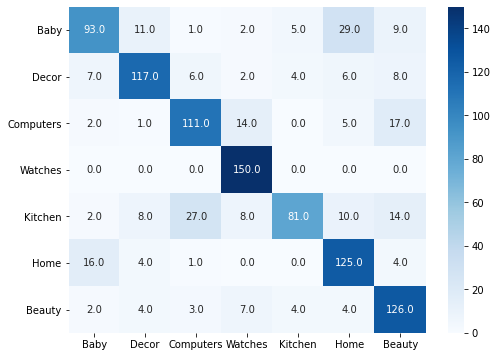

In [ ]:
list_labels=['Baby','Decor','Computers','Watches',
           'Kitchen','Home','Beauty']
df_cm = pd.DataFrame(conf_mat, index = [label for label in list_labels],
                  columns = [label for label in list_labels])
plt.figure(figsize = (8,6))
sns.heatmap(df_cm, annot=True, fmt='.1f', cmap="Blues")

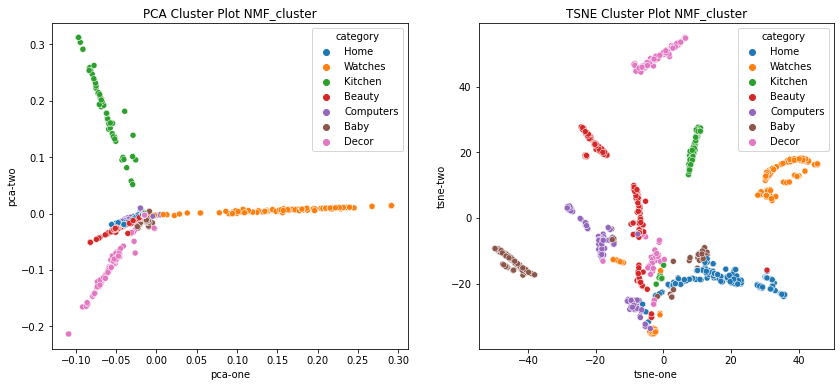

In [ ]:
cluster  = {0:'Baby',
            1:'Decor',
            2:'Computers',
            3:'Watches',
            4:'Kitchen',
            5:'Home',
            6:'Beauty'}

cls_labels_transform = cls_labels_transform.map(cluster)
plot_tsne_pca(nmf_matrix_N,'NMF_cluster',cls_labels_transform)

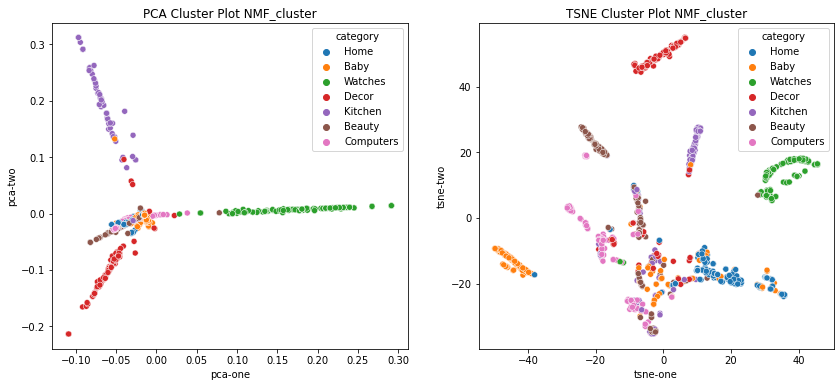

In [ ]:
plot_tsne_pca(nmf_matrix_N,'NMF_True',data['category'])

# Test- évaluation

In [ ]:
index1=randint(1, 1050)
index2=randint(1, 1050)
index3=randint(1, 1050)


In [ ]:
index1

415

In [ ]:
index2

177

In [ ]:
index3

628

In [ ]:
from PIL import Image
from random import *

path = "/content/drive/MyDrive/Fatma Aidi/Parcours OCR/Data/Images/"
def eval(index):
    im = Image.open(path+flipkart.image[index])
    print('Name:  ',flipkart['product_name'].iloc[index])
    print('categorie: ',data['category'].iloc[index])

    print('cluster: ',cls_labels_transform.iloc[index])

    plt.figure(figsize=(7,7))
    plt.imshow(im)

Name:   Printland PMR1834 Ceramic Mug
categorie:  Kitchen
cluster:  Kitchen


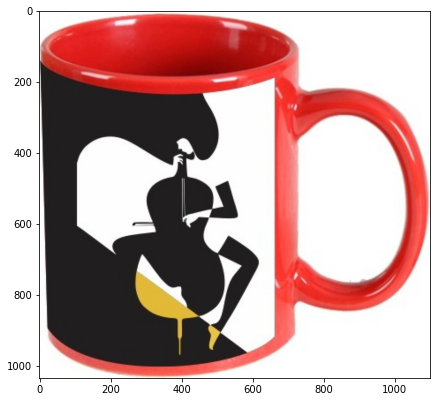

In [ ]:
eval(index2)

Name:   Printland PMR1834 Ceramic Mug
categorie:  Kitchen
cluster:  Kitchen


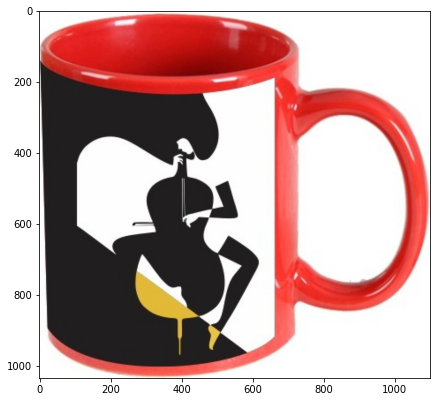

In [ ]:
eval(index2)

Name:   Intex Kids Inflatable Air Chair
categorie:  Baby
cluster:  Kitchen


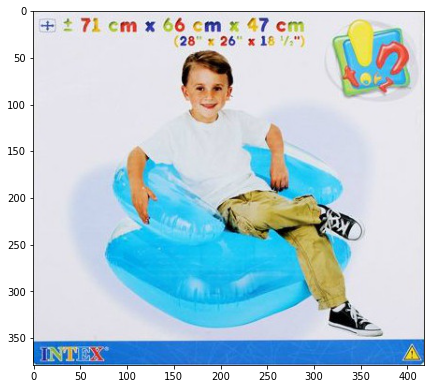

In [ ]:
eval(889)

In [ ]:
flipkart.iloc[index2]

uniq_id                                     5dbf978ab2cf9d2da6446d3e4595f690
crawl_timestamp                                    2015-12-01 12:40:44 +0000
product_url                http://www.flipkart.com/printland-pmr1834-cera...
product_name                                   Printland PMR1834 Ceramic Mug
product_category_tree      ["Kitchen & Dining >> Coffee Mugs >> Printland...
pid                                                         MUGEBFGF4ZDPGTZZ
retail_price                                                             650
discounted_price                                                         299
image                                   5dbf978ab2cf9d2da6446d3e4595f690.jpg
is_FK_Advantage_product                                                False
description                Printland PMR1834 Ceramic Mug (350 ml)\r\n    ...
product_rating                                           No rating available
overall_rating                                           No rating available

In [5]:
flipkart.product_name.iloc[889]

'Intex Kids Inflatable Air Chair'

In [ ]:
flipkart.product_category_tree.iloc[index1]

'["Beauty and Personal Care >> Fragrances >> Deodorants >> Combos >> Ajmal Combos"]'

In [ ]:
flipkart.description.iloc[889]

'Buy Intex Kids Inflatable Air Chair for Rs.429 online. Intex Kids Inflatable Air Chair at best prices with FREE shipping & cash on delivery. Only Genuine Products. 30 Day Replacement Guarantee.'

In [ ]:
cls_labels_transform.iloc[index]

'Kitchen'